In [137]:
import joblib
import matplotlib.pyplot as plt
from training_data.Training_Data_Class import training_dataset
from Social_Dataset_Class import social_dataset
import numpy as np
from scipy.interpolate import interp1d
import pdb
from tqdm import tqdm 
from scipy.ndimage.filters import gaussian_filter1d,uniform_filter1d
from scipy.ndimage.morphology import binary_dilation
from scipy.signal import savgol_filter

In [195]:
groundtruth = training_dataset('training_data/CollectedData_Taiga.h5','training_data/')
vstats,mstats = [groundtruth.stats_wholemouse([i+1 for i in range(100)],m) for m in range(2)]
## Take a sample dataset where you know there are long confusion periods: 
# doi = social_dataset(path+'28'+scorer1)
data = joblib.load('all_datasets_2_26_deconv')

In [139]:
path = '../../Downloads/V118_03182018_cohousing-Camera-1-Animal-1-Segment1cropped_part'

In [4]:
def find_segments(indices):
    differences = np.diff(indices)
    all_intervals = []
    ## Initialize with the first element added:
    interval = []
    interval.append(indices[0])
    for i,diff in enumerate(differences):
        if diff == 1:
            pass # interval not yet over
        else:
            # last interval ended
            if interval[0] == indices[i]:
                interval.append(indices[i]+1)
            else:
                interval.append(indices[i])
            all_intervals.append(interval)
            # start new interval
            interval = [indices[i+1]]
        if i == len(differences)-1:
            interval.append(indices[-1]+1)
            all_intervals.append(interval)
    return all_intervals

In [104]:
# Function to find all shepherding events in all data
def find_events(data):
    lengths = [np.shape(datainst.dataset.values)[0] for datainst in data]
    totallength = np.sum(np.array(lengths))
    print(totallength)
    all_events = np.zeros((totallength,2))
    # all_v = []
    # all_m = []
    ## When interactions light up, register these in this big time-indexed matrix:
    for i in range(len(data)):
        length =np.shape(data[i].dataset.values)[0]
        events = np.zeros((length,2))
        ## Stipulate that at least one mouse is out of the nest:
        vnest = data[i].nest_ethogram(0)
        mnest = data[i].nest_ethogram(1)
        bnest = (~vnest*~mnest)
        ## Stipulate that the mice are close to each other: 
        close = [dist < 100 for dist in data[i].proximity()]
        smooth,leading = data[i].orderedtracking()
        smooth[abs(smooth)> 16] = np.nan
        criteria = smooth*bnest[:-1]*close[:-1]

        criteria_binary = criteria>2

        criteria_smooth = criteria_binary

        ## Find the trajectory at appropriate time points:
        trajs = data[i].render_trajectories([0,3,5,8])
        poi = np.where(criteria_smooth)


        sleading = leading[poi]

        vleading = np.where(sleading >0)[0]
        mleading = np.where(sleading <-0)[0]

        events[vleading,0] = 1
        events[mleading,1] = 1
        cumlength = np.sum(np.array(lengths[:i])).astype(int)
        all_events[cumlength:cumlength+length,:] = events 
    return all_events

In [105]:
# Function to find all shepherding durations in data:
def find_duration(data):
    all_v = []
    all_m = []
    for i in range(30):
        ## Stipulate that at least one mouse is out of the nest:
        vnest = data[i].nest_ethogram(0)
        mnest = data[i].nest_ethogram(1)
        bnest = (~vnest*~mnest)
        ## Stipulate that the mice are close to each other: 
        close = [dist < 100 for dist in data[i].proximity()]
        smooth,leading = data[i].orderedtracking()
        smooth[abs(smooth)> 16] = np.nan
        criteria = smooth*bnest[:-1]*close[:-1]

        ## Find the trajectory at appropriate time points:
        trajs = data[i].render_trajectories([0,3,5,8])
        poi = np.where(criteria>2)[0]
        leading = np.sign(leading[poi])

        vleading = len(np.where(leading == 1)[0])
        mleading = len(np.where(leading == -1)[0])
        all_v.append(vleading)
        all_m.append(mleading)
    return all_v,all_m
    


In [106]:
def plot_durations(all_m,all_v):
    ms = np.array(all_m)
    vs = np.array(all_v)
    ms= np.concatenate((ms,np.array([0,0,0,0,200])))
    vs= np.concatenate((vs,np.array([0,0,0,0,65])))
    print(vs,ms)
    plt.bar(np.arange(35),(vs+ms),color = 'blue',label = 'virgin')
    zerobars = plt.bar(np.arange(35),ms+vs ==0,color = 'black')
    zerobars[30].set_color('white')
    zerobars[31].set_color('white')
    zerobars[32].set_color('white')
    zerobars[33].set_color('white')
    plt.bar(np.arange(35),ms.astype(float),color = 'red',label = 'dam')
    plt.xlabel('Section (20 minutes)')
    plt.xticks(np.arange(35)[::5])
    plt.ylabel('Count (frames)')
    plt.axvline(x = 31.5,color ='black')
    plt.title('Counts of Pursuit Duration Initiated by Virgin or Dam')
    plt.legend()
    plt.savefig('count_duration.png')
    plt.show()

In [107]:
# def plot_events(counts):
# #     counts = [np.sum(sess,axis = 0) for sess in all_events]

#     [counts.append(np.zeros(2,)) for _ in range(4)]
#     counts.append(np.array([36,16]))
#     a = np.stack(counts)[:,0]
#     b = np.stack(counts)[:,1]

#     plt.bar(np.arange(35),1,color = 'blue',label = 'virgin')
#     zerobars = plt.bar(np.arange(35),a+b ==0,color = 'black')
#     zerobars[30].set_color('white')
#     zerobars[31].set_color('white')
#     zerobars[32].set_color('white')
#     zerobars[33].set_color('white')
#     plt.bar(np.arange(35),a.astype(float)/(a+b),color = 'red',label = 'dam')
#     plt.xlabel('Section (20 minutes)')
#     plt.ylabel('Proportion')
#     plt.title('Proportion of Pursuit Events Initiated by Virgin or Dam')
#     plt.xticks(np.arange(35)[::5])
#     plt.axvline(x = 31.5,color = 'black')
#     plt.legend()
#     plt.savefig('proportion_events.png')
#     plt.show()



In [108]:
out = find_events(data)


1080000


In [123]:
np.sum(out[1040000:,1])

151.0

In [109]:
plot_events(out)

ValueError: all input arrays must have the same shape

In [110]:
%debug

> /Users/taigaabe/anaconda3/lib/python2.7/site-packages/numpy/core/shape_base.py(353)stack()
    351     shapes = set(arr.shape for arr in arrays)
    352     if len(shapes) != 1:
--> 353         raise ValueError('all input arrays must have the same shape')
    354 
    355     result_ndim = arrays[0].ndim + 1

ipdb> len(counts)
*** NameError: name 'counts' is not defined
ipdb> u
> <ipython-input-107-9b345a4744af>(6)plot_events()
      4     [counts.append(np.zeros(2,)) for _ in range(4)]
      5     counts.append(np.array([36,16]))
----> 6     a = np.stack(counts)[:,0]
      7     b = np.stack(counts)[:,1]
      8 

ipdb> len(counts)
1080005
ipdb> counts[-1]
array([36, 16])
ipdb> counts[-2]
array([0., 0.])
ipdb> counts[-10]
0.0

KeyboardInterrupt


In [41]:
blackouts = [17,20,23,26,27]
blackout_inds = [np.arange(20*60*30)+blackout*20*60*30 for blackout in blackouts]

In [52]:
all_events = find_events(data)
all_durations = find_duration(data)
# vfiltered = gaussian_filter1d(all_events[:,0],36000)
# mfiltered = gaussian_filter1d(all_events[:,1],36000)
v_extra = gaussian_filter1d([0,65,0],36000)
m_extra = gaussian_filter1d([0,200,0],36000)

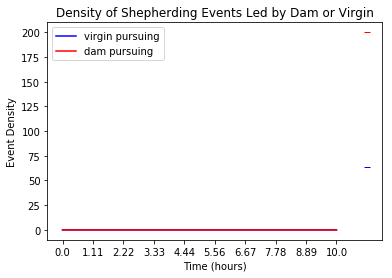

In [51]:
plt.plot(vfiltered,color = 'blue',label ='virgin pursuing')
plt.plot(mfiltered,color = 'red',label = 'dam pursuing')
plt.plot(1200000,v_extra,'b_')
plt.plot(1200000,m_extra,'r_')
plt.title('Density of Shepherding Events Led by Dam or Virgin')
plt.ylabel('Event Density')
plt.xlabel('Time (hours)')
# [plt.fill_between(blackout_ind,0,np.max(vfiltered),color='black') for blackout_ind in blackout_inds]
plt.legend()
plt.xticks(np.linspace(0,30*20*60*30,10),np.round(np.linspace(0,30*20*60*30,10)/(30*60*60),2))
plt.show()

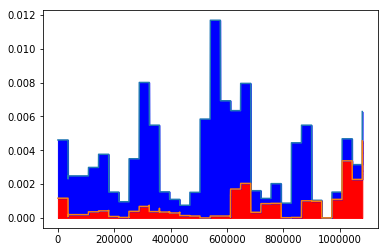

In [92]:
plt.plot(vfiltered+mfiltered)
plt.plot(mfiltered)
plt.fill_between(np.arange(len(vfiltered)),0,mfiltered,color = 'red')
plt.fill_between(np.arange(len(vfiltered)),mfiltered,vfiltered+mfiltered,color ='blue')
plt.show()

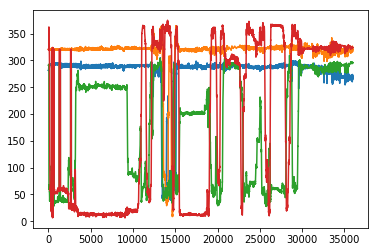

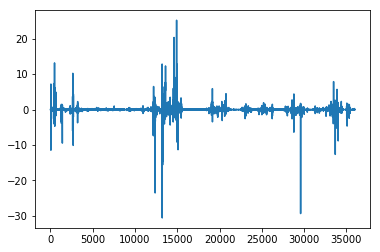

In [45]:
plt.plot(data[14].render_trajectories([8])[0])
plt.plot(data[14].render_trajectories([3])[0])
plt.show()
plt.plot(data[14].tracking())

In [ ]:
doi = data[23]

In [ ]:
plt.plot(doi.tracking())

vals = [trackval>1 for trackval in doi.tracking()]

In [ ]:
plt.plot(vals)

In [ ]:
path = '../../Downloads/V118_03182018_cohousing-Camera-1-Animal-1-Segment1cropped_part'


doi.import_movie(path+'13.mp4')

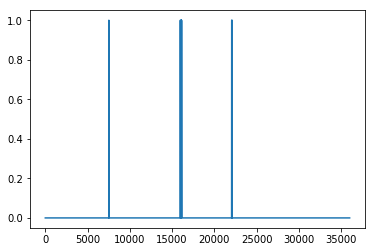

In [33]:
doi = data[24]
plt.plot(doi.shepherding_ethogram())

In [57]:
laterpath ='../../Downloads/V118_03232018_cohousing with mom and 12 pups-Camera-1-Animal-1-Segment1cropped_part14DeepCut_resnet50_social_v3Nov2shuffle1_1030000.h5'

In [60]:
example_later = social_dataset(laterpath,vers = 1)

In [62]:
example_later.filter_check_replace_p([i for i in range(10)])

100%|██████████| 15733/15733 [00:12<00:00, 1219.51it/s]


In [10]:
example_later.filter_crosscheck_replaces_v2([i for i in range(10)],vstats,mstats,thresh=[2,2])

In [11]:
example_later.filter_segment_replaces([i for i in range(5)])

100%|██████████| 15780/15780 [00:00<00:00, 39129.83it/s]


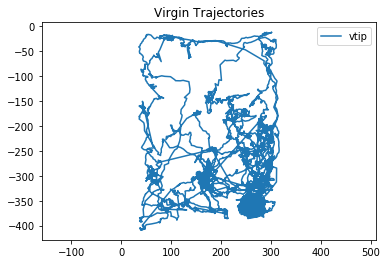

In [12]:
example_later.plot_trajectory([0])

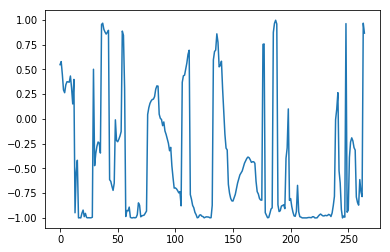

In [13]:
example_later.bounds = (210,300)
events = np.zeros(example_later.dataset.shape)
## Stipulate that at least one mouse is out of the nest:
vnest = example_later.nest_ethogram(0)
mnest = example_later.nest_ethogram(1)
bnest = (~vnest*~mnest)
## Stipulate that the mice are close to each other: 
close = [dist < 100 for dist in example_later.proximity()]
smooth,leading = example_later.orderedtracking()
smooth[abs(smooth)> 16] = np.nan
criteria = smooth*bnest[:-1]*close[:-1]

criteria_binary = criteria>2

criteria_smooth = criteria_binary

## Find the trajectory at appropriate time points:
trajs = example_later.render_trajectories([0,3,5,8])
poi = np.where(criteria_smooth)


sleading = leading[poi]
plt.plot(sleading)
#     print(sleading)
vleading = np.where(sleading >0)[0]
mleading = np.where(sleading <-0)[0]

In [81]:
all_events = []
example_later.bounds = (210,300)
events = np.zeros(example_later.dataset.shape)
## Stipulate that at least one mouse is out of the nest:
vnest = example_later.nest_ethogram(0)
mnest = example_later.nest_ethogram(1)
bnest = (~vnest*~mnest)
## Stipulate that the mice are close to each other: 
close = [dist < 100 for dist in example_later.proximity()]
smooth,leading = example_later.orderedtracking()
smooth[abs(smooth)> 16] = np.nan
criteria = smooth*bnest[:-1]*close[:-1]

criteria_binary = criteria>2

criteria_smooth = criteria_binary

## Find the trajectory at appropriate time points:
trajs = example_later.render_trajectories([0,3,5,8])
poi = np.where(criteria_smooth)[0]
if len(poi):
    segs = find_segments(poi)
    events = np.zeros((len(segs),2))


    for segind,seg in enumerate(segs):
        start,end = seg[0],seg[1]
        event_sign = np.sign(np.sum(leading[start:end]))
        events[segind,int(event_sign == 1)] = 1
        print(event_sign==1)

    all_events.append(events)


    poi_onehot = [j in poi for j in range(36000)]
    cuts = [traj[poi,:] for traj in trajs]
#     fig,ax = plt.subplots(2)

#     [ax[0].plot(cut[:,0],cut[:,1]) for cut in cuts]
#     ax[0].set_aspect('equal')
#     ax[1].plot(criteria)
    print(i)

    rel_speedv = data[i].relative_speed(0)
    relspeedsv = [rel_speedv[loc-100:loc+100] for loc in poi]
    rel_speedm = data[i].relative_speed(1)
    relspeedsm = [rel_speedm[loc-100:loc+100] for loc in poi]
#     for locind in range(len(poi)):
#         plt.plot(relspeedsv[locind])
#         plt.plot(relspeedsm[locind])
#         plt.show()
#     if i in [0,9,13,19,29]:
#         plt.plot(relspeedsv[locind])
#         plt.plot(relspeedsm[locind])
#         plt.show()
#         print('makingvid')
#         try:
#             data[i].import_movie(path+str(i)+'.mp4')
#             data[i].highlights_reel(str(i)+'pursuits',poi_onehot,buffer = 50)
#         except:
#             print('movietroubles')
#     plt.show()
else:
    all_events.append(np.zeros((1,2)))

True
True
False
False
False
False
False
False
False
True
False
True
True
False
False
True
False
False
False
False
False
True
False
True
False
False
False
True
True
False
False
True
False
True
False
False
False
False
False
False
False
False
False
True
False
True
False
False
False
False
True
True
2
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))


((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(13666, 13733)


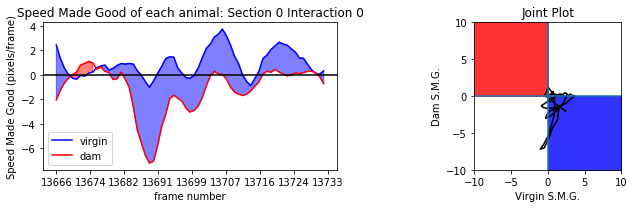

(13745, 13828)


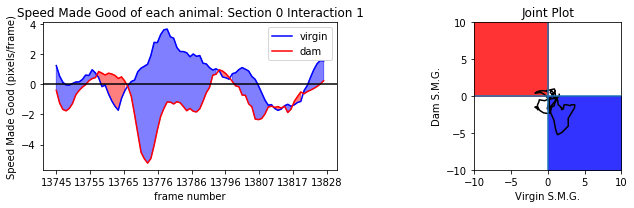

(13976, 14025)


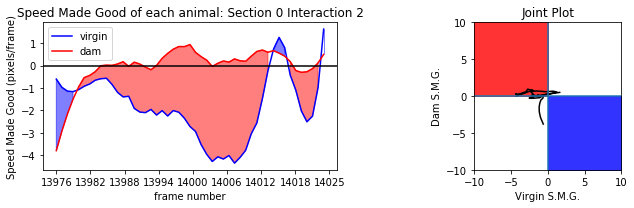

(14030, 14205)


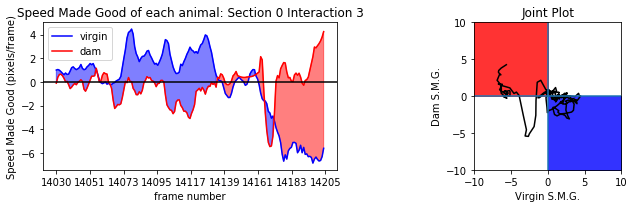

(14208, 14260)


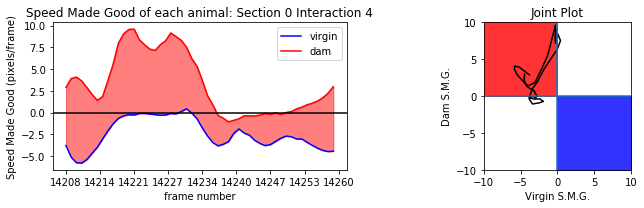

(18245, 18311)


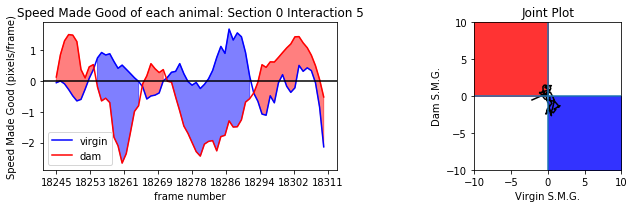

(18887, 18941)


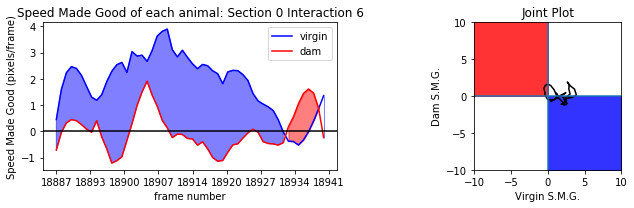

(19595, 19675)


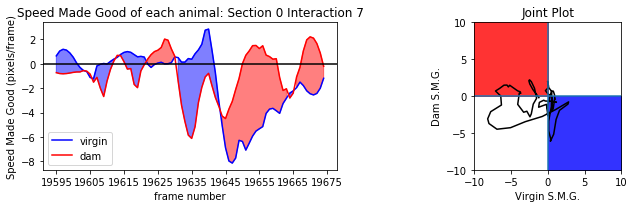

(20667, 20727)


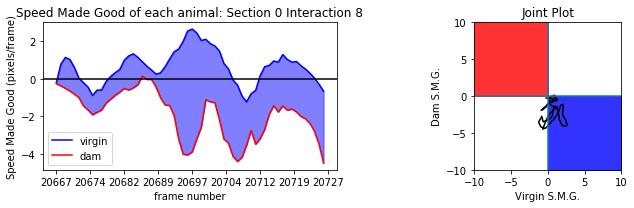

(21139, 21201)


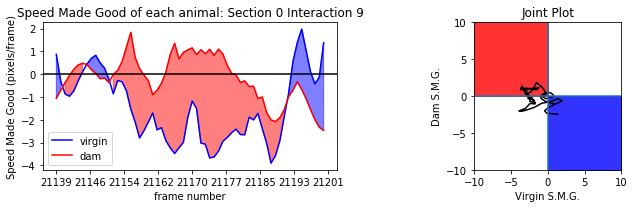

(21652, 21708)


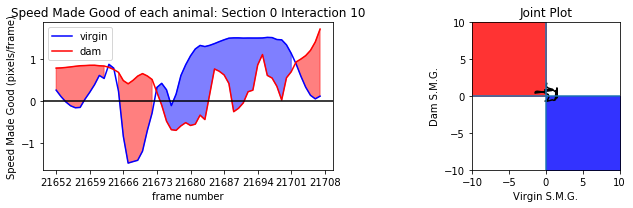

(28642, 28695)


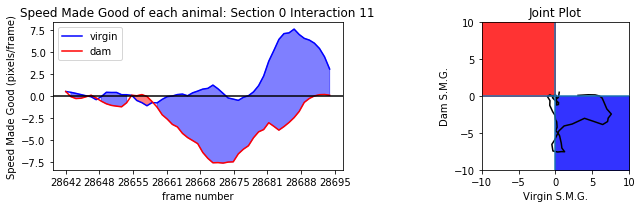

(28742, 28841)


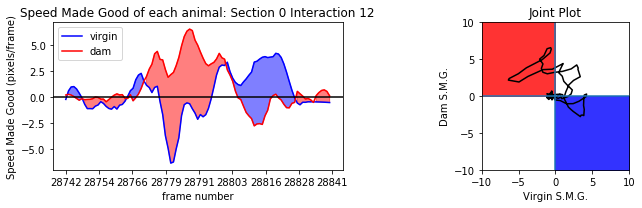

0
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(8305, 8411)


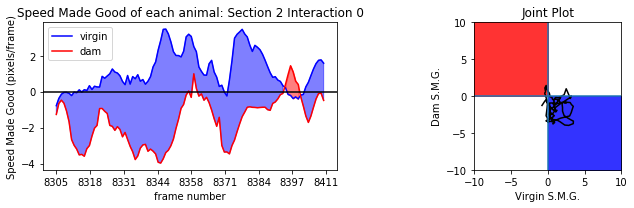

(8445, 8563)


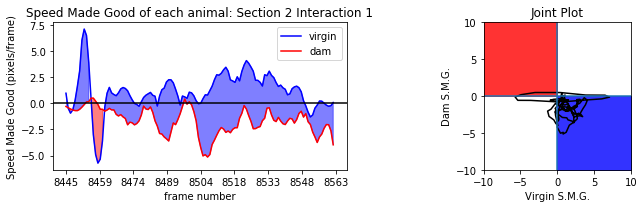

(8859, 8931)


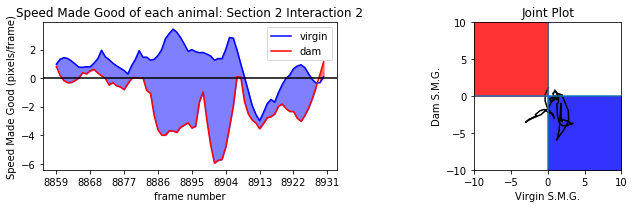

(10057, 10234)


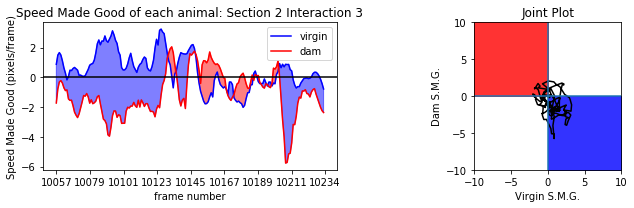

(10514, 10624)


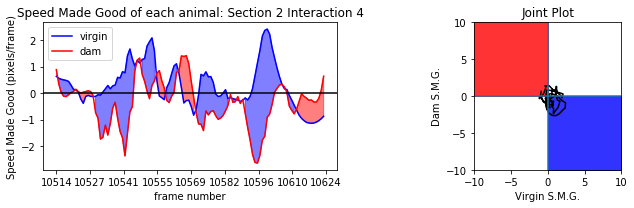

(10877, 10926)


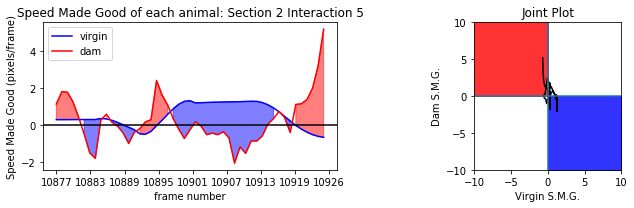

(11040, 11089)


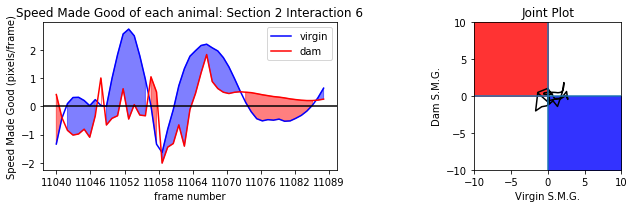

(11111, 11180)


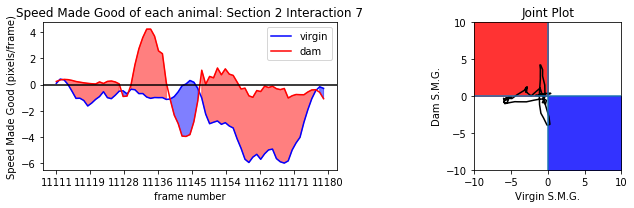

2
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(18402, 18479)


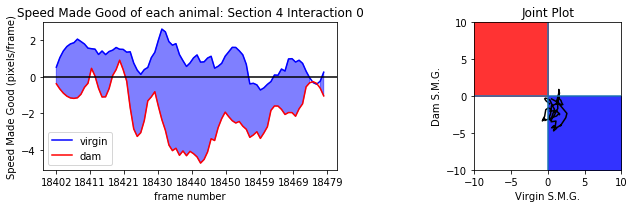

(19051, 19107)


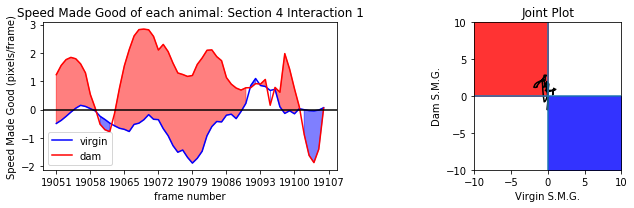

(20118, 20207)


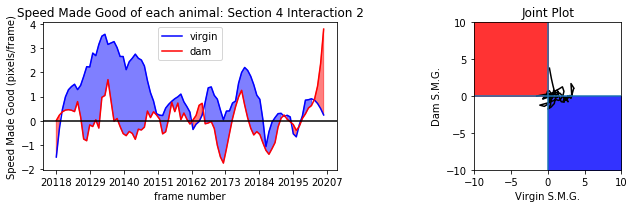

(20216, 20272)


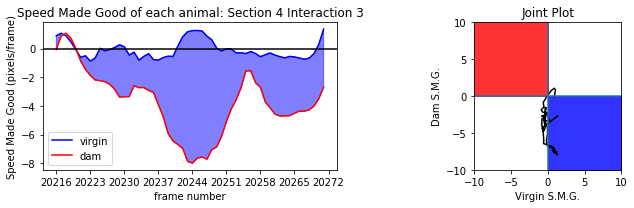

(20660, 20711)


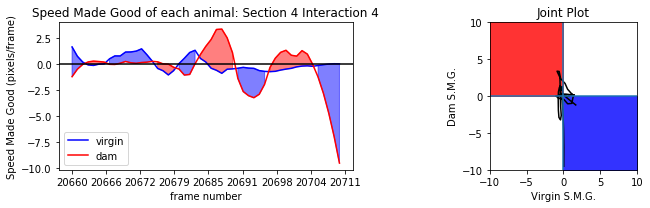

(20713, 20767)


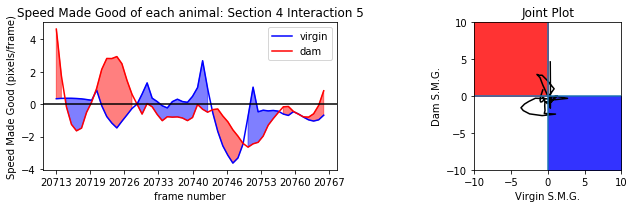

(21121, 21218)


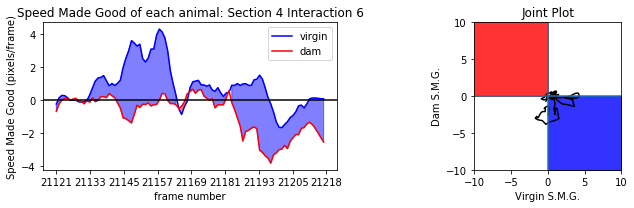

(32514, 32676)


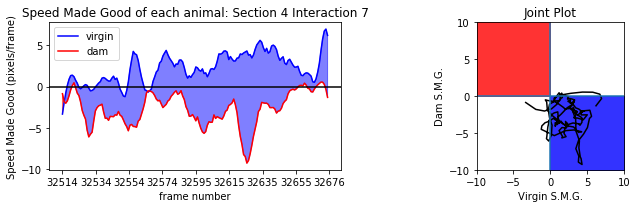

(32724, 32794)


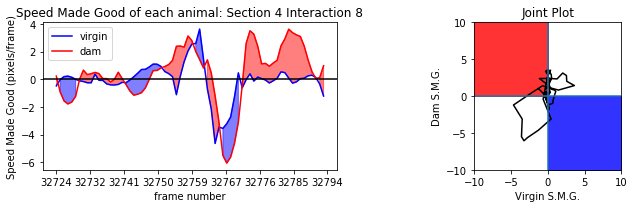

(32815, 32875)


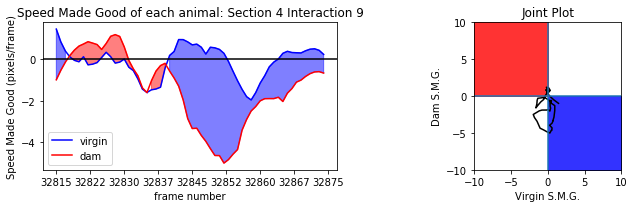

(33154, 33214)


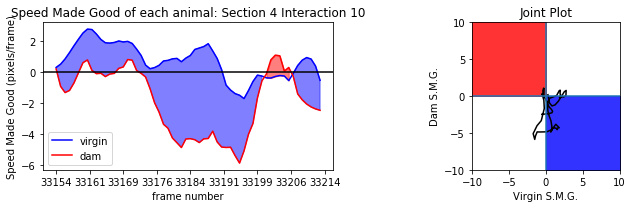

(33844, 33914)


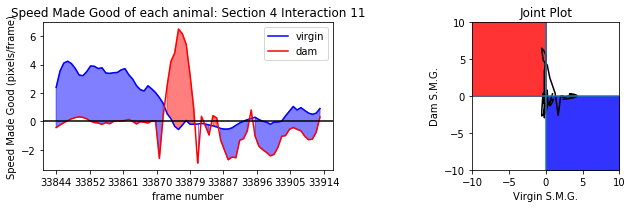

(33932, 33985)


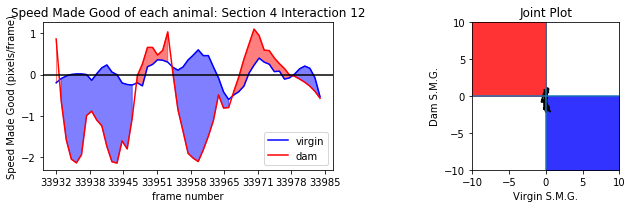

(34065, 34120)


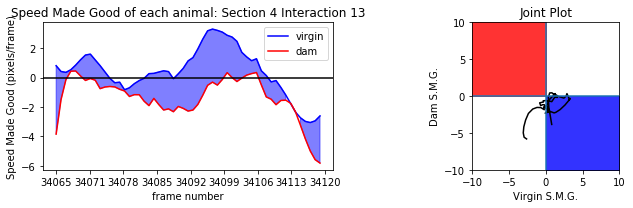

(35713, 35766)


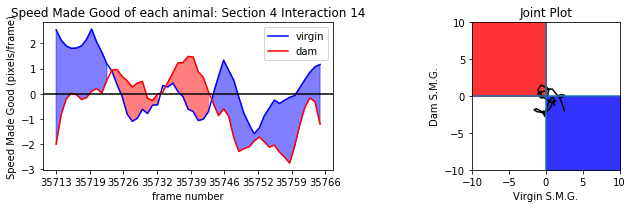

4
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(1082, 1155)


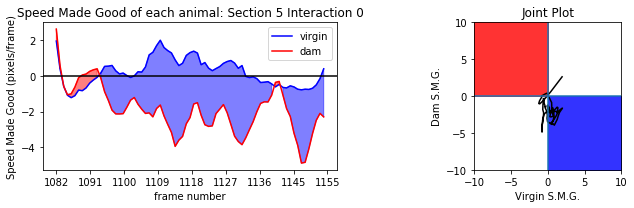

(4336, 4387)


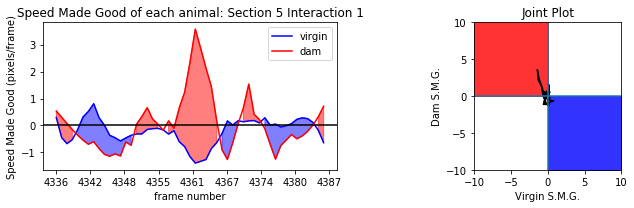

(7305, 7354)


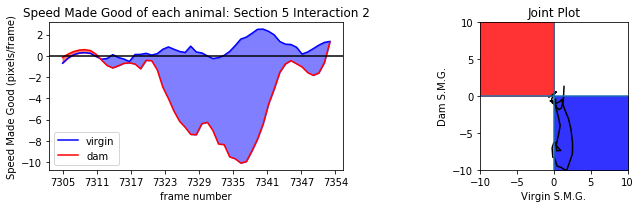

(8458, 8508)


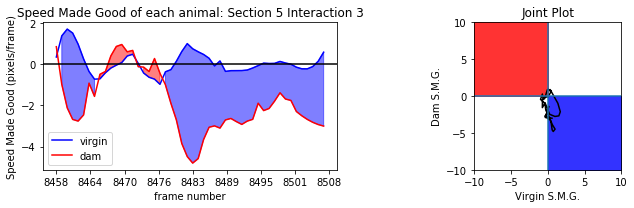

(9655, 9711)


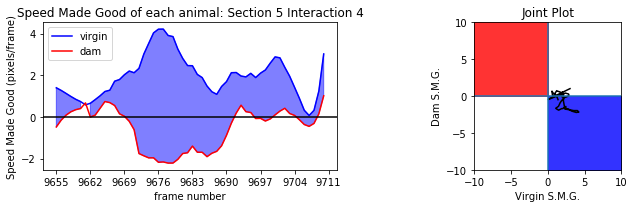

(10101, 10153)


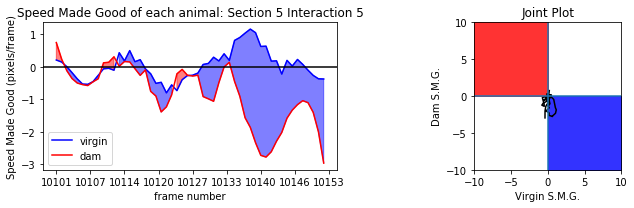

(10271, 10339)


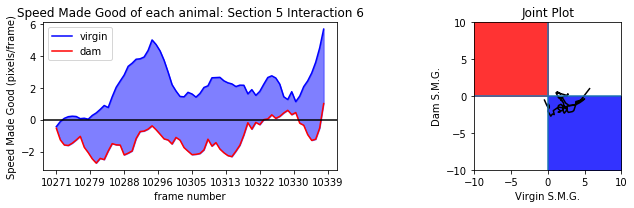

5
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(25969, 26085)


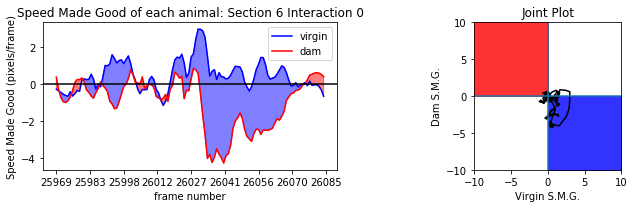

(26602, 26700)


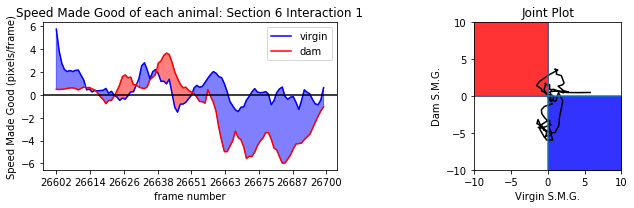

(26740, 26804)


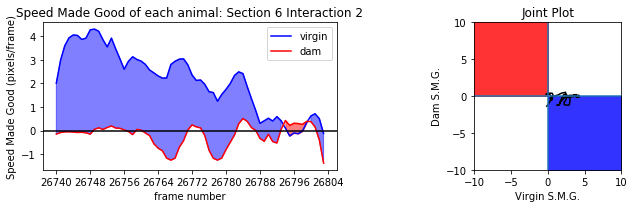

(26975, 27045)


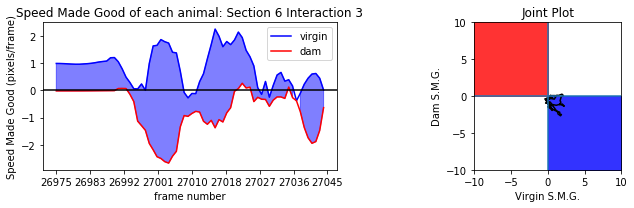

6
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(6566, 6633)


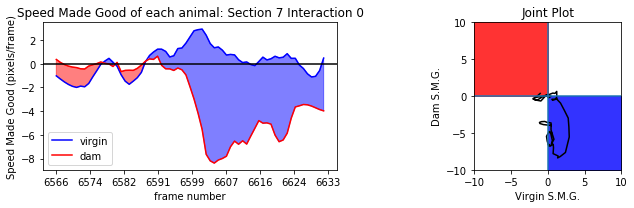

7
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(21959, 22065)


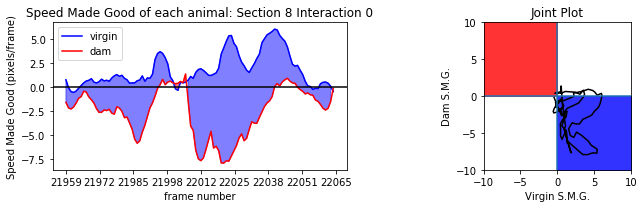

(23185, 23234)


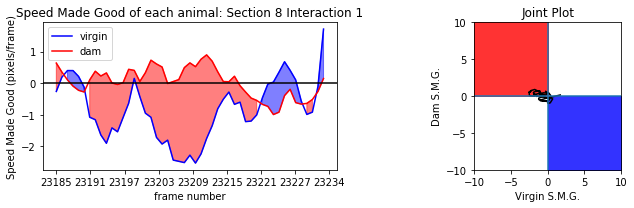

(23461, 23514)


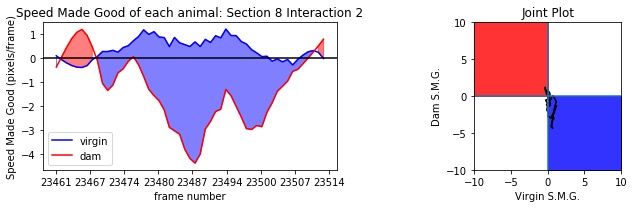

(23516, 23646)


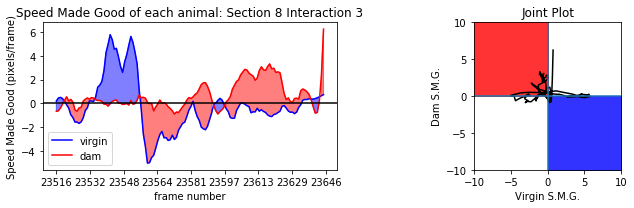

(23694, 23748)


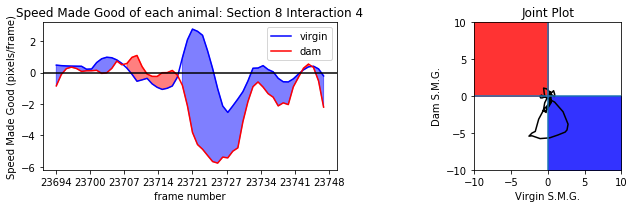

(24697, 24851)


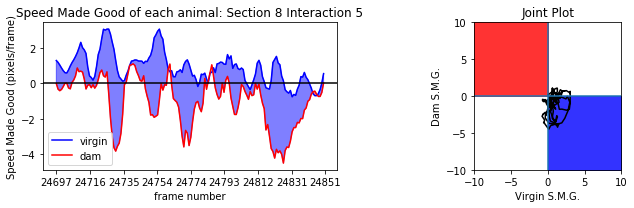

(25696, 25762)


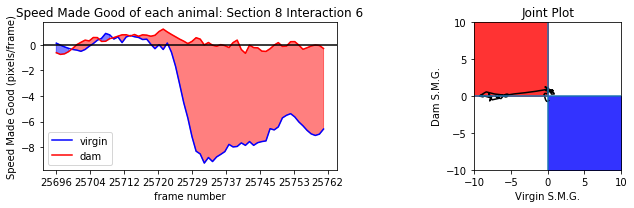

(26902, 26955)


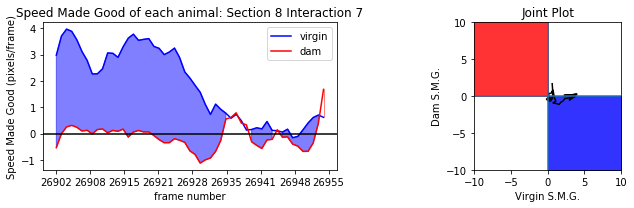

(27167, 27274)


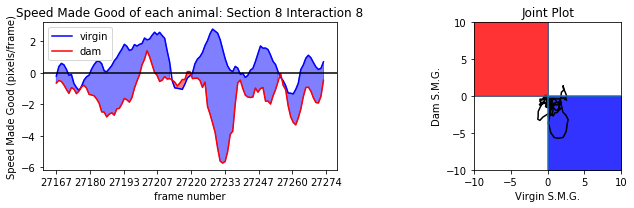

(27354, 27407)


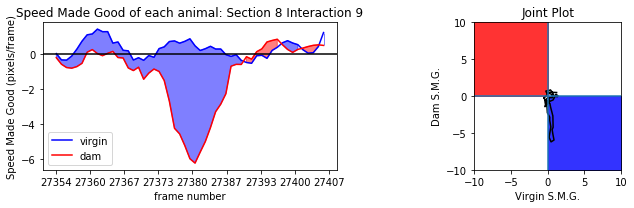

(27412, 27617)


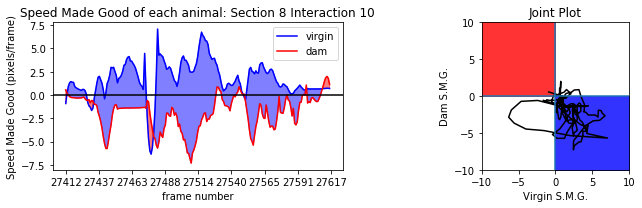

(28981, 29035)


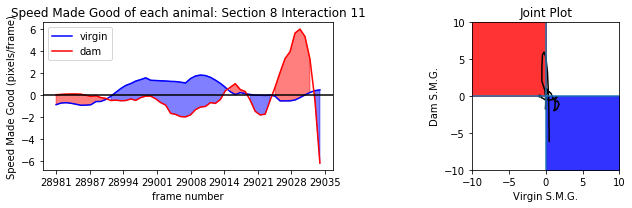

(31594, 31648)


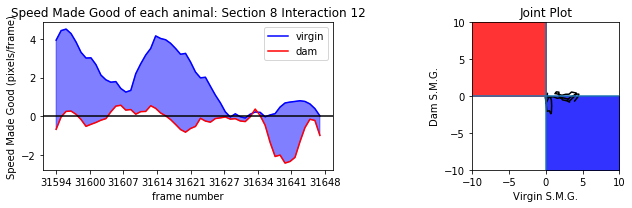

8
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(16953, 17028)


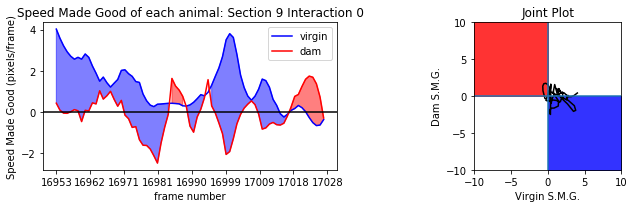

(17265, 17318)


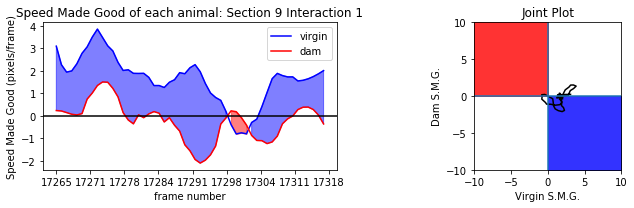

(19764, 19828)


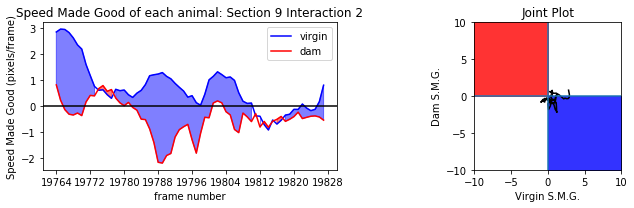

(20080, 20143)


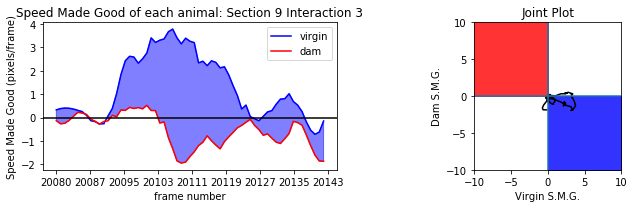

(24958, 25009)


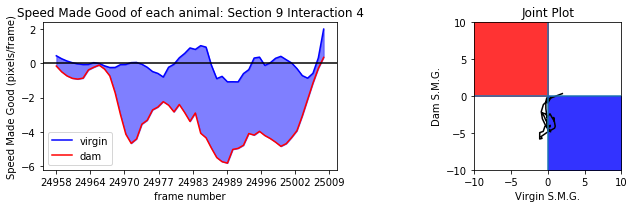

(25433, 25482)


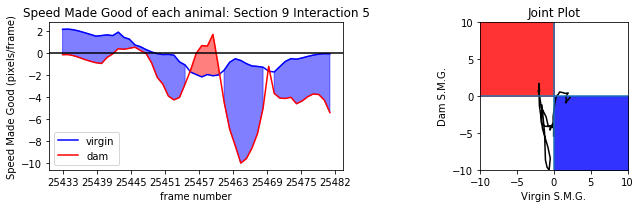

(25798, 25850)


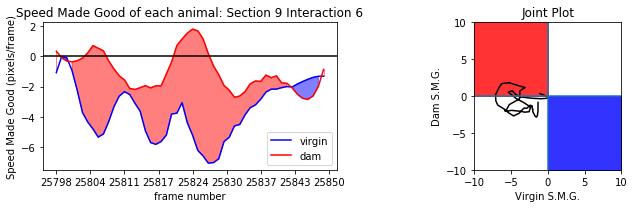

(26991, 27043)


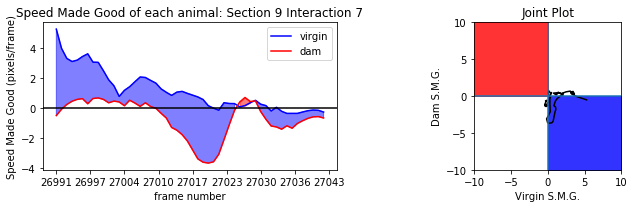

(27640, 27693)


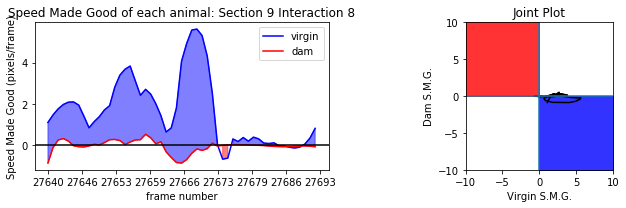

(31208, 31450)


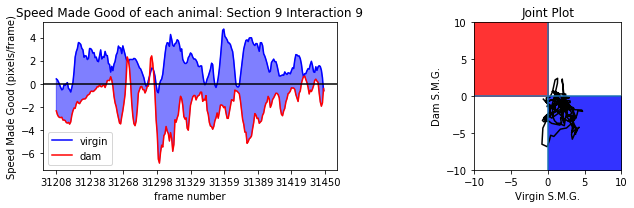

(31455, 31657)


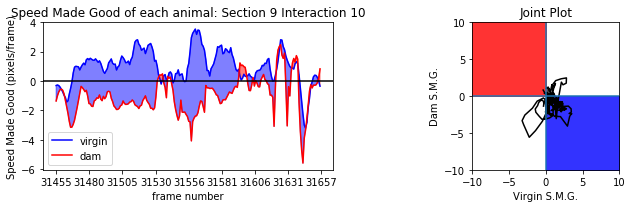

(31979, 32263)


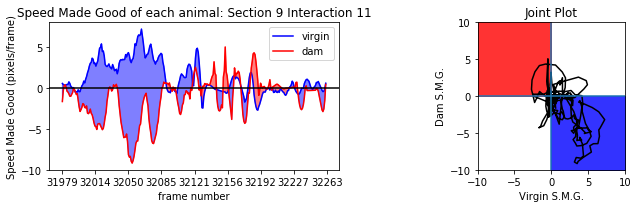

(32328, 32382)


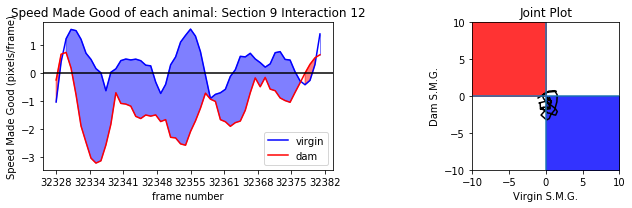

(32802, 32910)


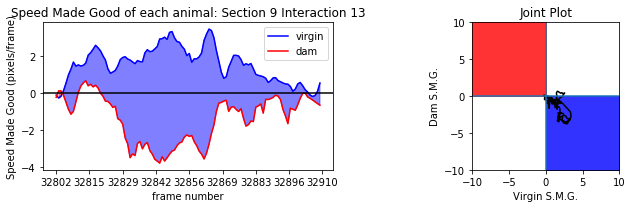

(33120, 33175)


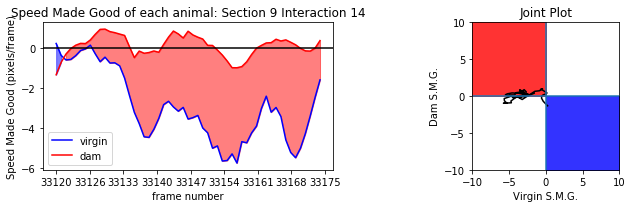

(35359, 35408)


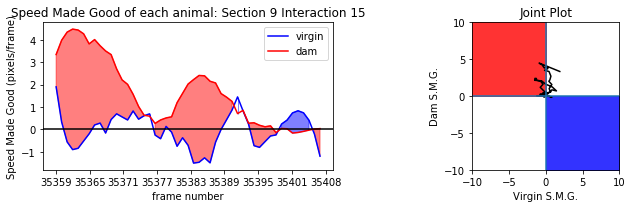

(35521, 35689)


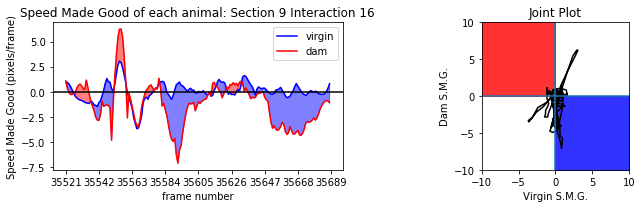

9
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(1164, 1238)


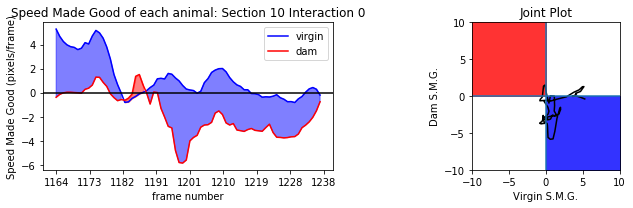

(2993, 3054)


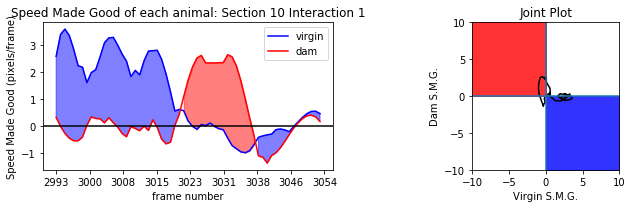

(3071, 3146)


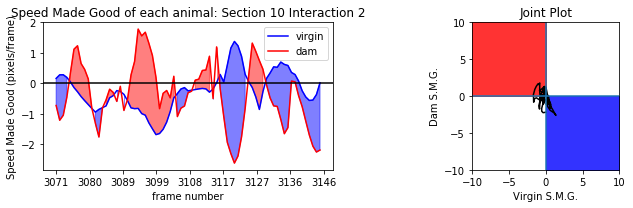

(3290, 3381)


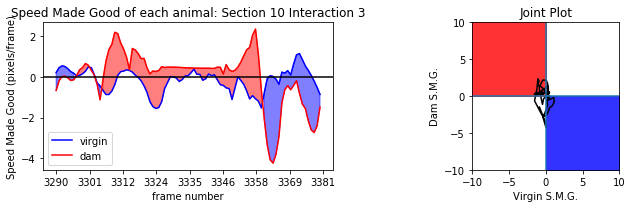

(3465, 3620)


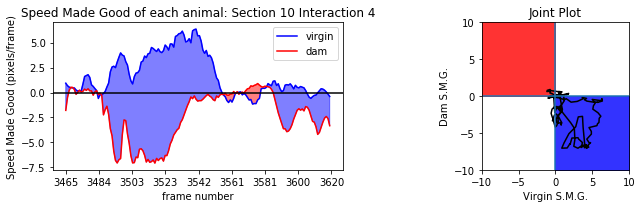

10
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(15137, 15189)


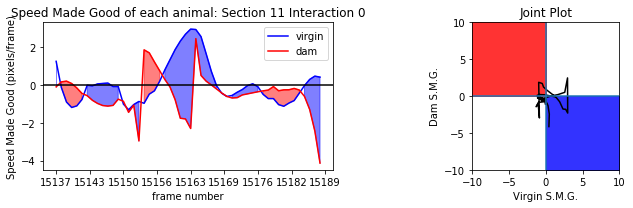

(17966, 18021)


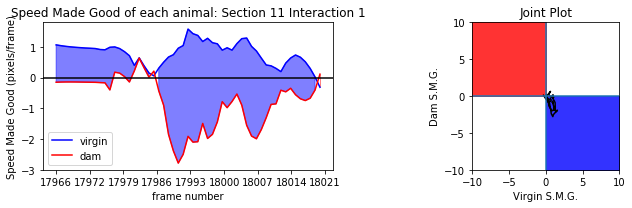

(19194, 19245)


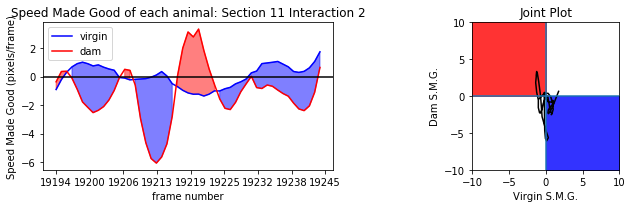

(19427, 19480)


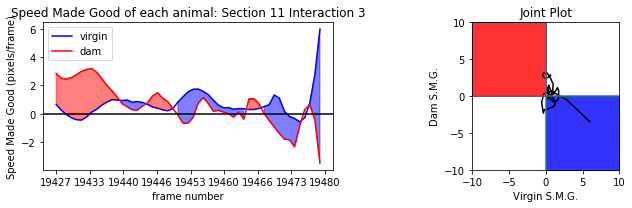

(19483, 19643)


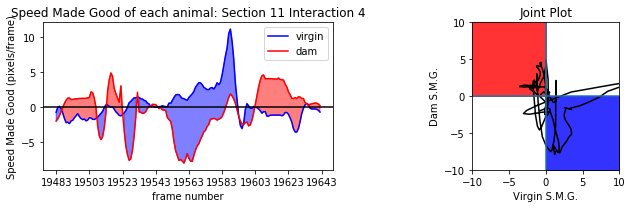

11
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(416, 472)


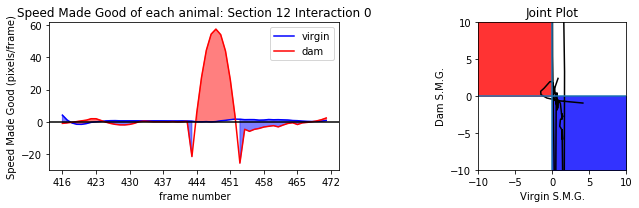

(594, 681)


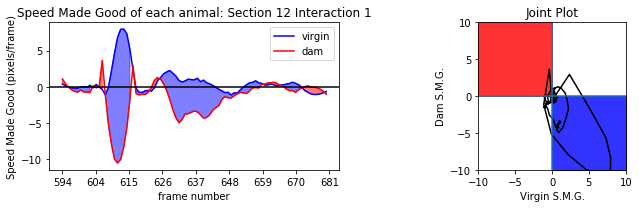

12
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(4374, 4462)


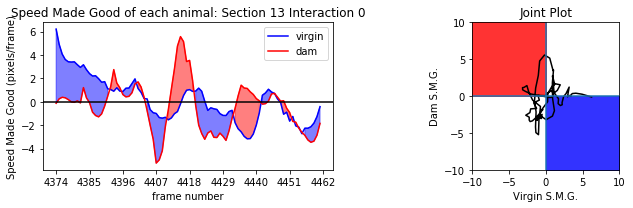

(4835, 4913)


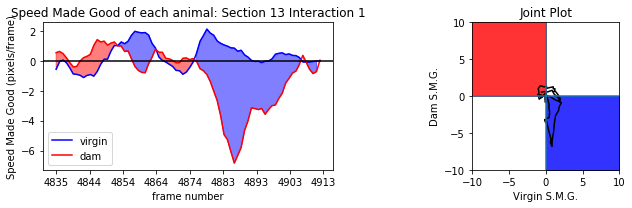

(4948, 5000)


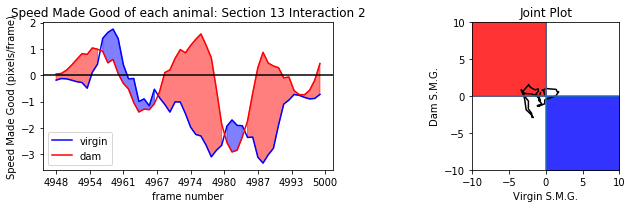

(10448, 10498)


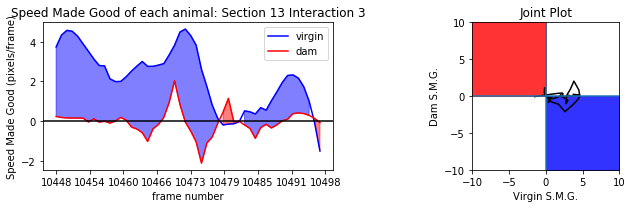

(11316, 11370)


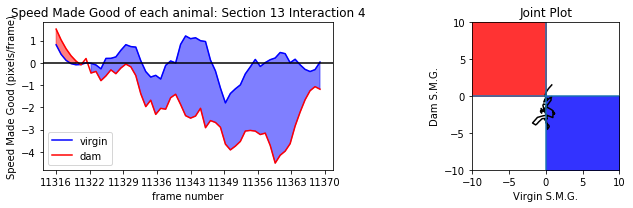

13
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(13442, 13500)


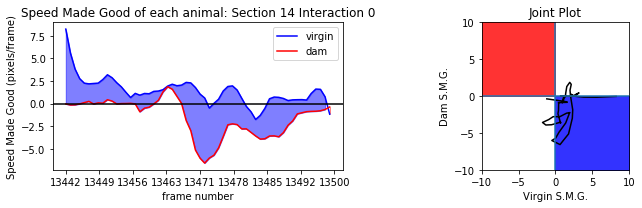

(13567, 13633)


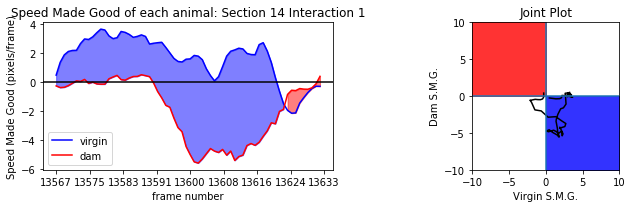

(14592, 14644)


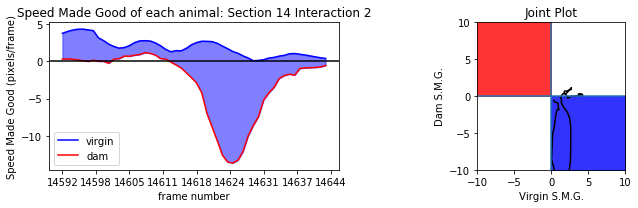

(14715, 14817)


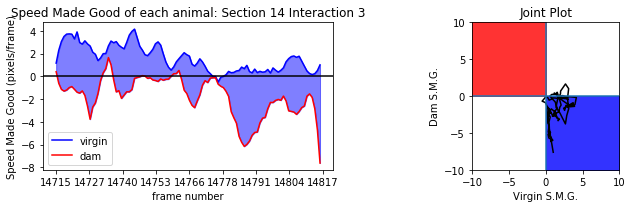

(14867, 14942)


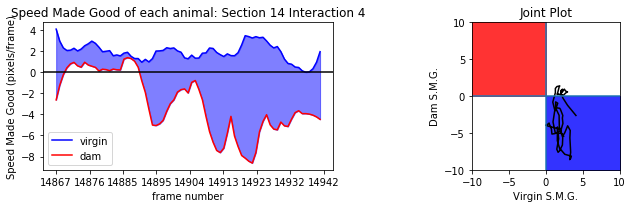

(14955, 15012)


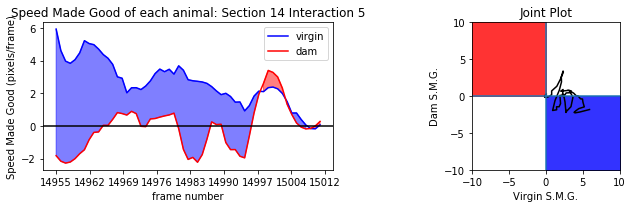

(15035, 15085)


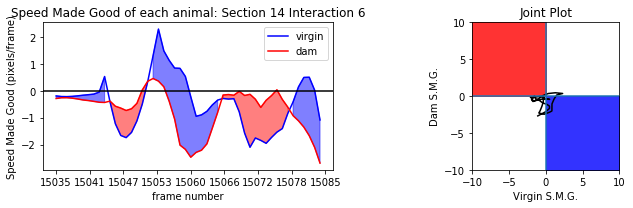

14
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(35072, 35538)


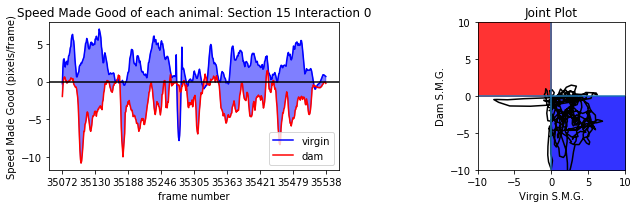

(35703, 35999)


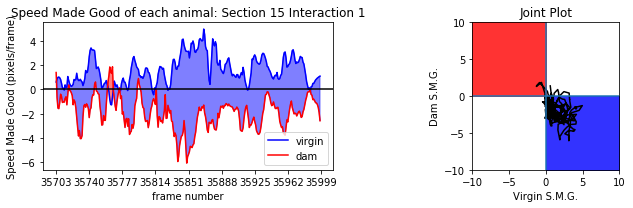

15
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(0, 24)


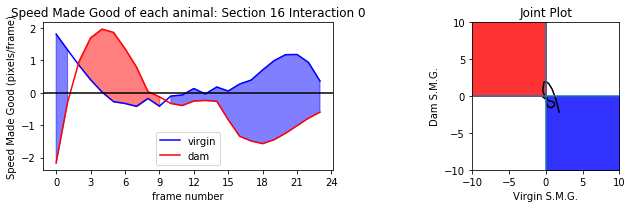

(329, 381)


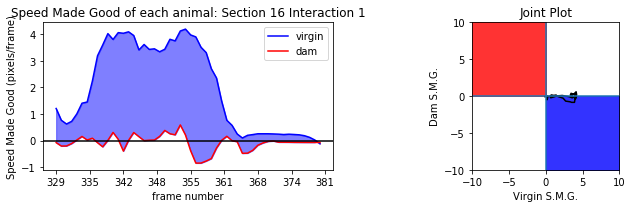

(444, 498)


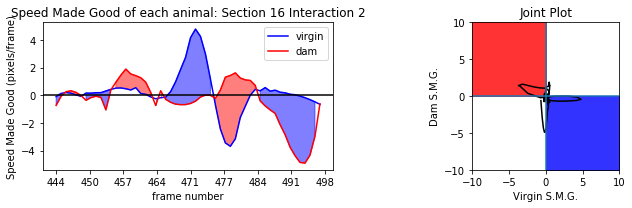

(1027, 1100)


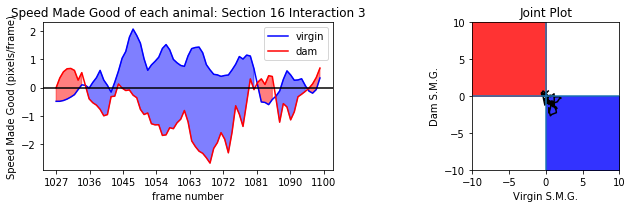

(1634, 1704)


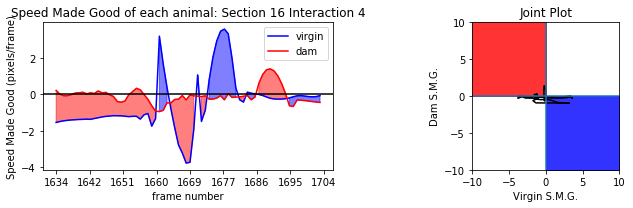

(5238, 5299)


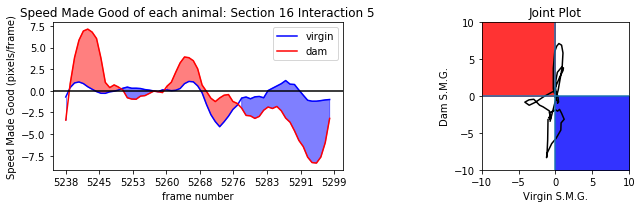

(14546, 14601)


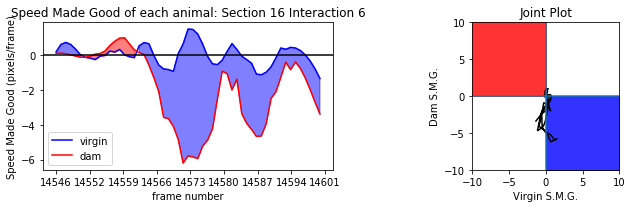

(20667, 20867)


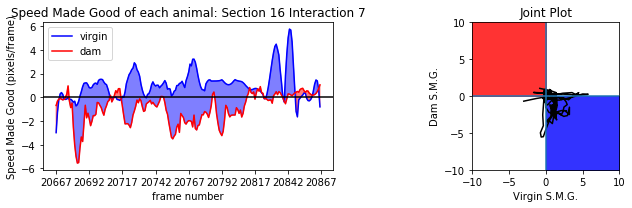

(25353, 25845)


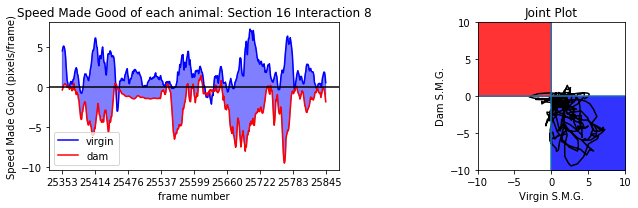

(27932, 27983)


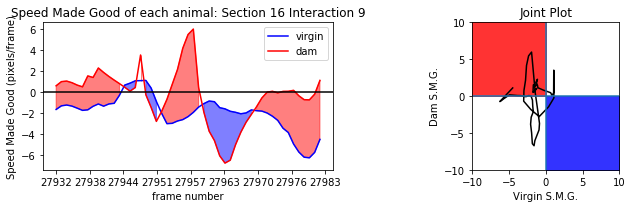

(30047, 30280)


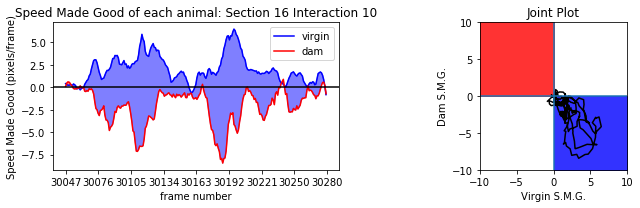

(30339, 30388)


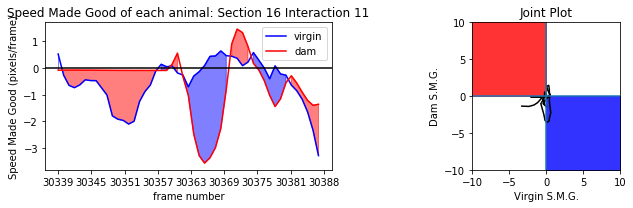

(30432, 30551)


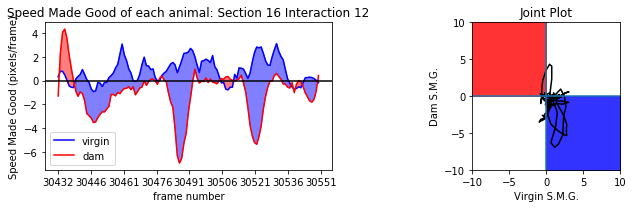

(30647, 30770)


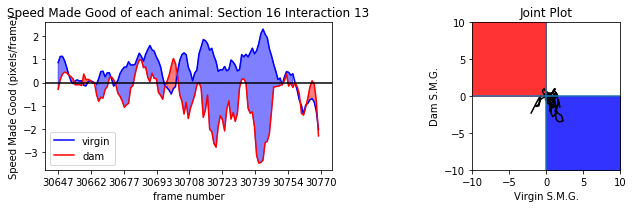

(30892, 30952)


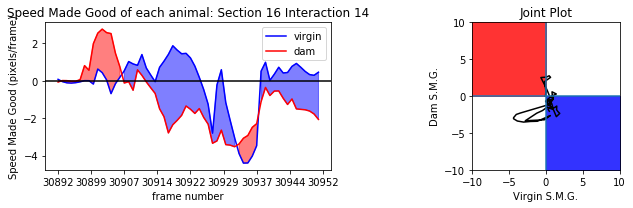

(30957, 31011)


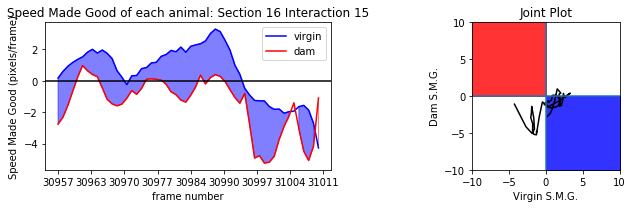

(31167, 31386)


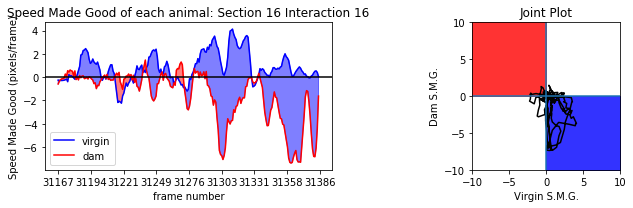

(31571, 31757)


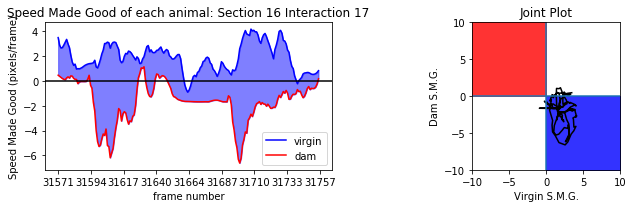

16
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(12468, 12693)


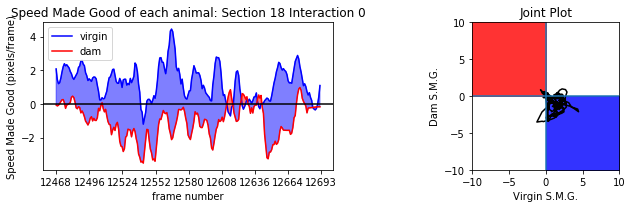

(12736, 13017)


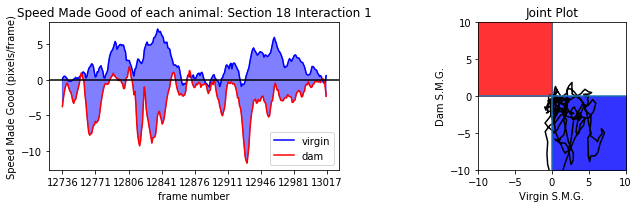

(13025, 13084)


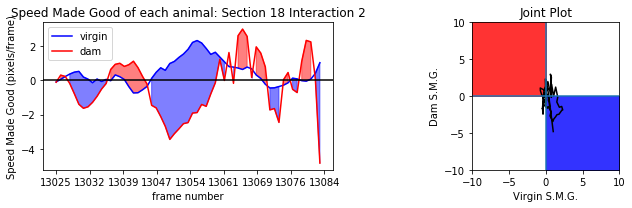

(13705, 13757)


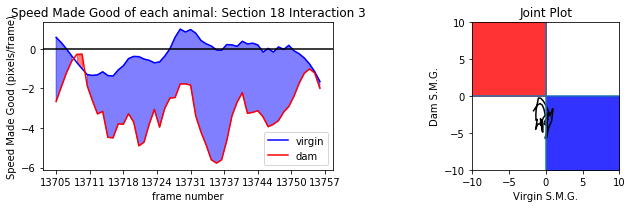

(13898, 13951)


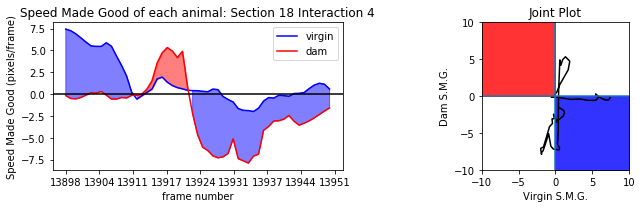

(14626, 14825)


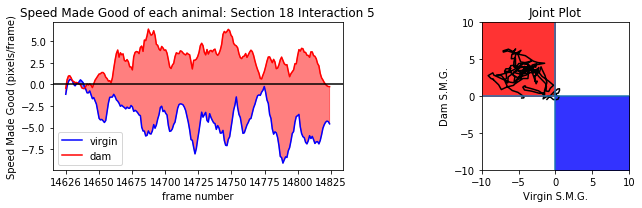

(15654, 15707)


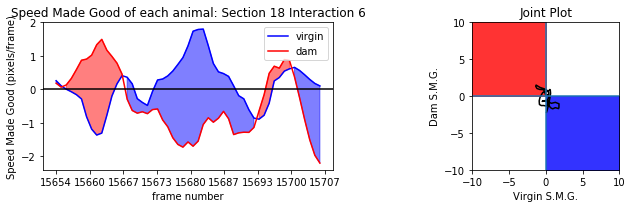

(23618, 23727)


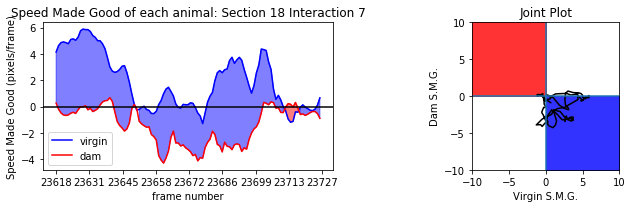

(23759, 23827)


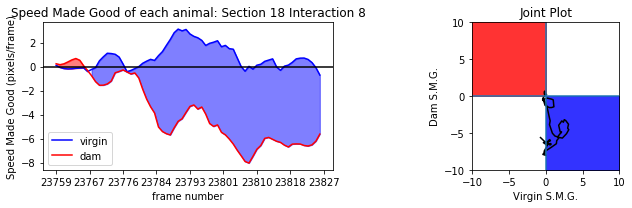

(24403, 24480)


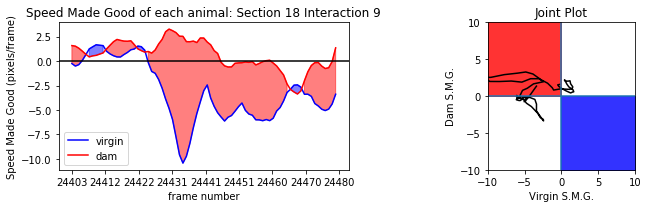

(24582, 24661)


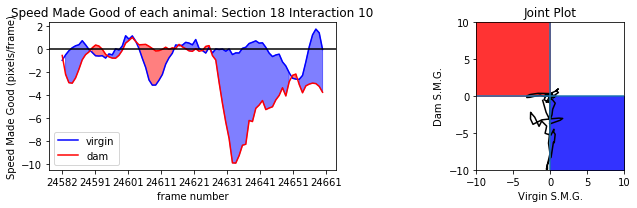

(30845, 30904)


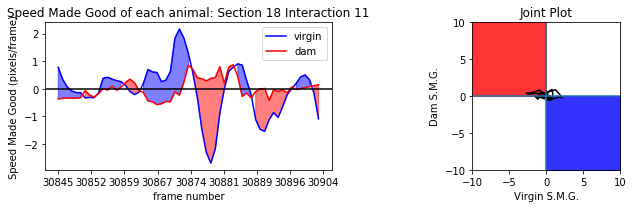

(33727, 33823)


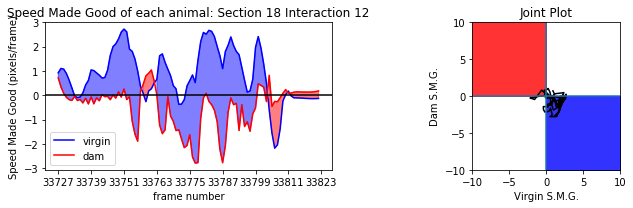

(34660, 34872)


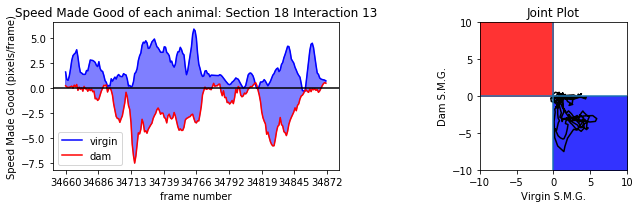

18
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(2462, 2514)


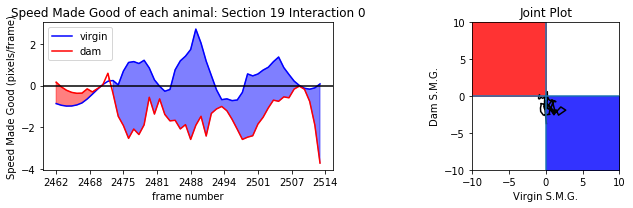

(13006, 13155)


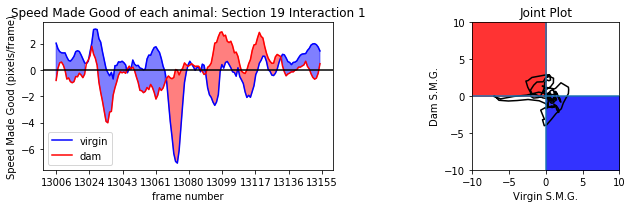

(13460, 13510)


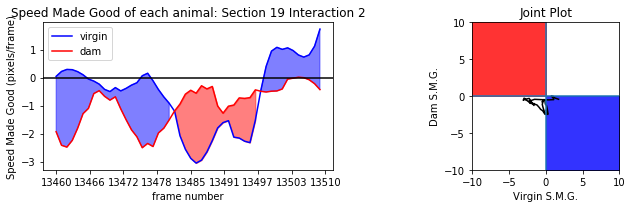

(13621, 13677)


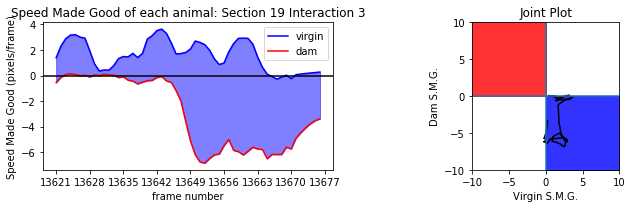

(15451, 15534)


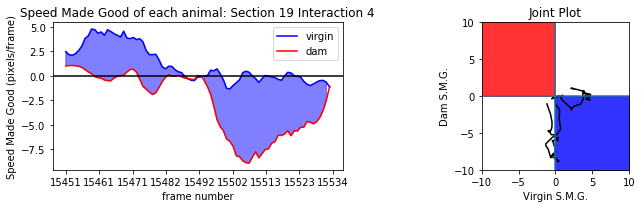

(15618, 15670)


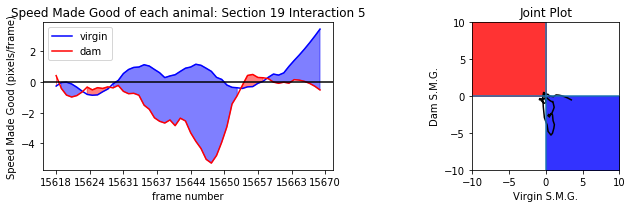

(16100, 16151)


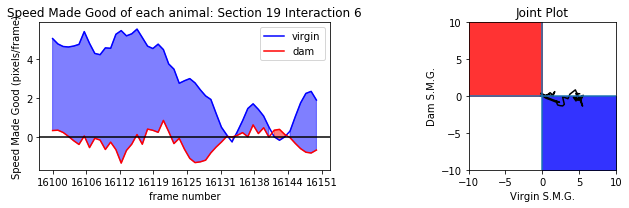

(16173, 16224)


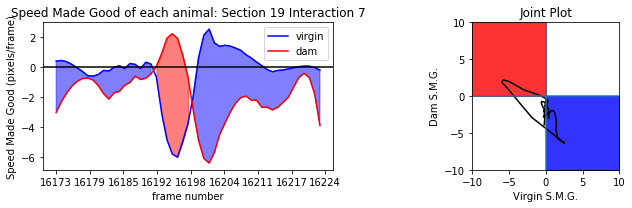

(23830, 23933)


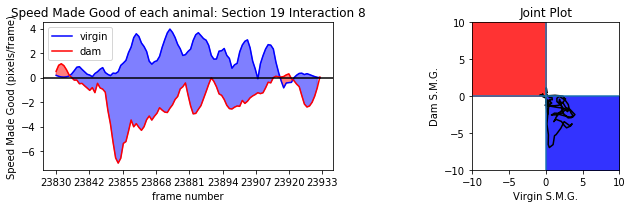

19
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(29465, 29520)


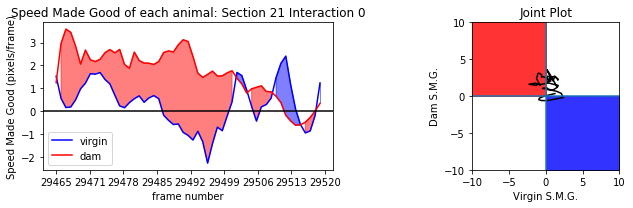

(29614, 29813)


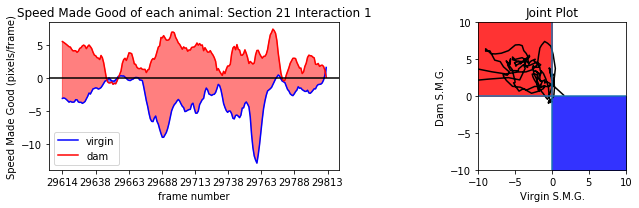

(31589, 31766)


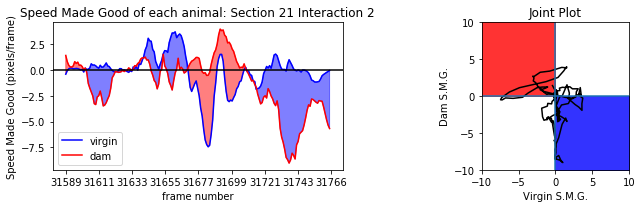

21
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(264, 357)


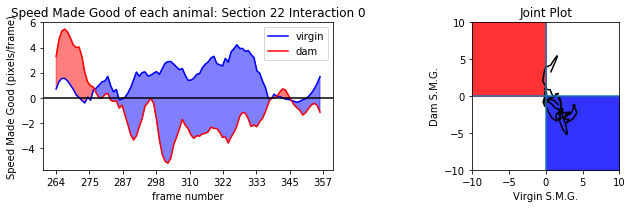

(4930, 4982)


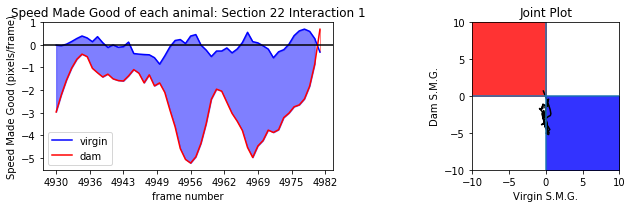

(5213, 5270)


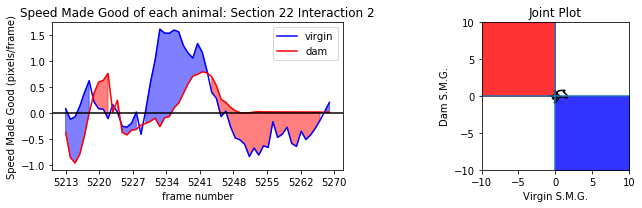

(6274, 6373)


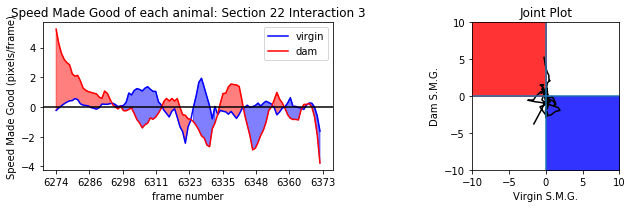

(25390, 25440)


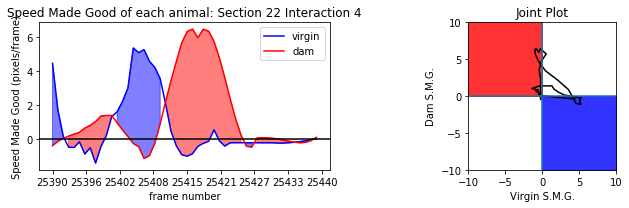

22
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(7423, 7541)


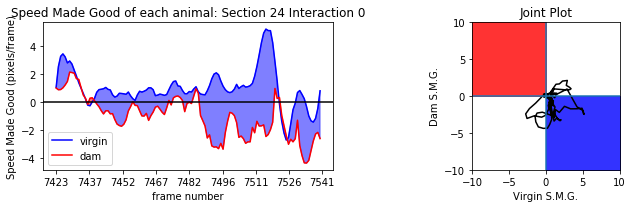

(15746, 15799)


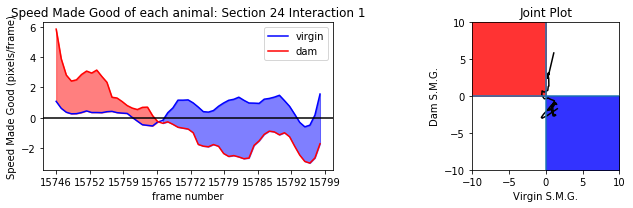

(15858, 16143)


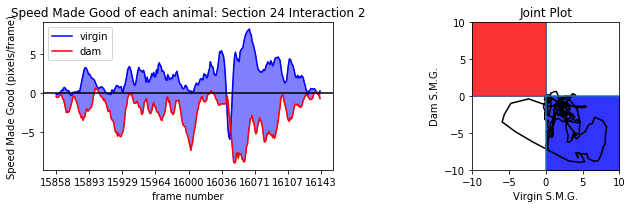

(18201, 18283)


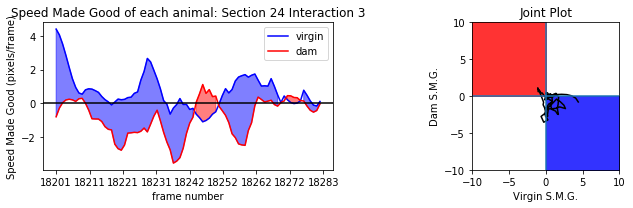

(18420, 18470)


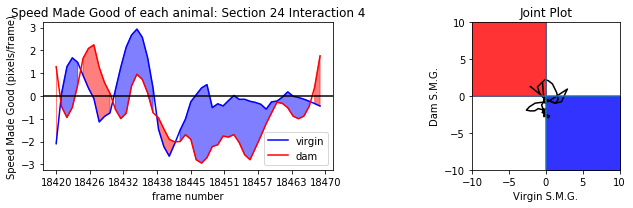

(18534, 18583)


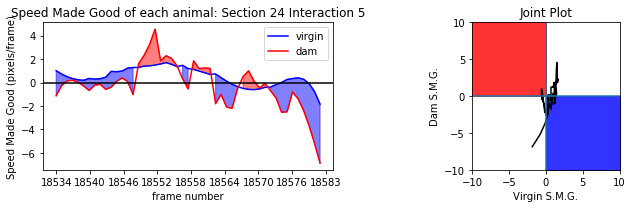

(19187, 19265)


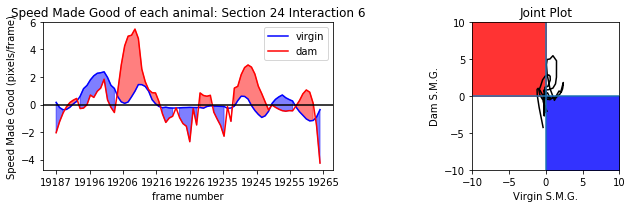

(21048, 21149)


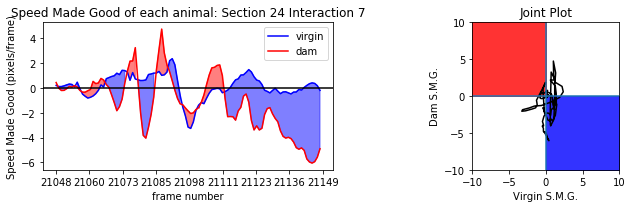

(21337, 21408)


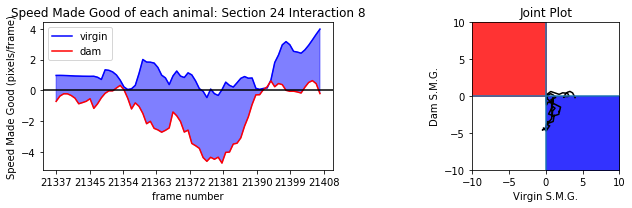

(21435, 21487)


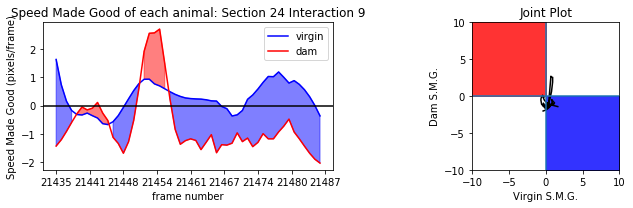

(21492, 21542)


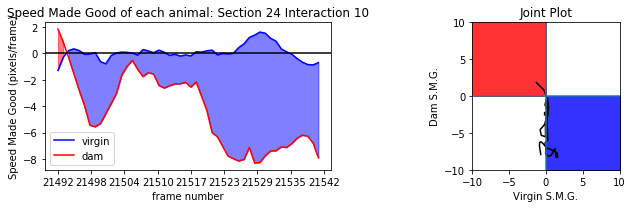

(21796, 21849)


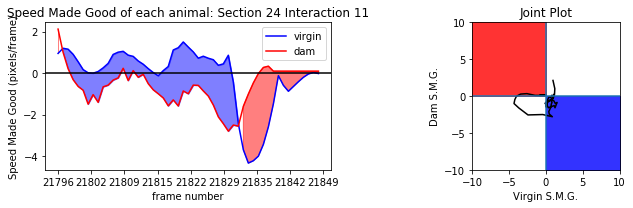

(21955, 22173)


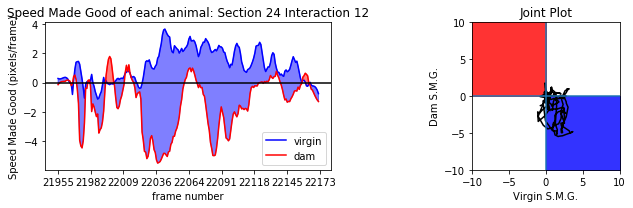

(22230, 22339)


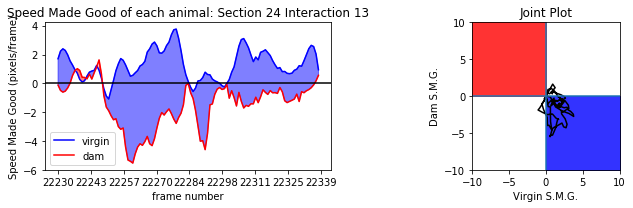

(22382, 22431)


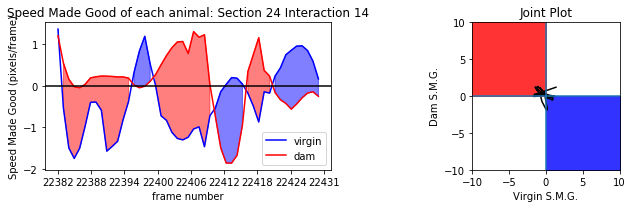

(22524, 22588)


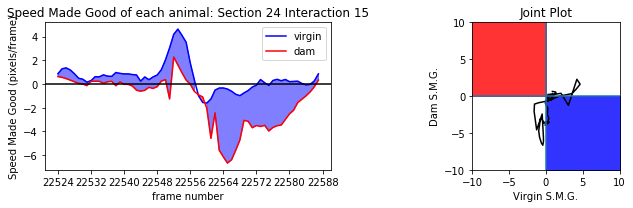

(22610, 22669)


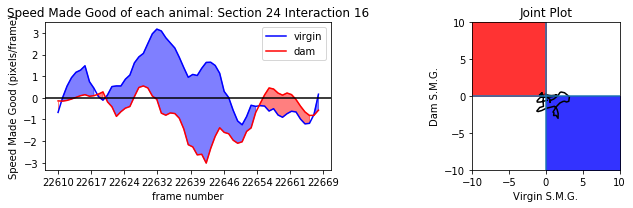

(22858, 22909)


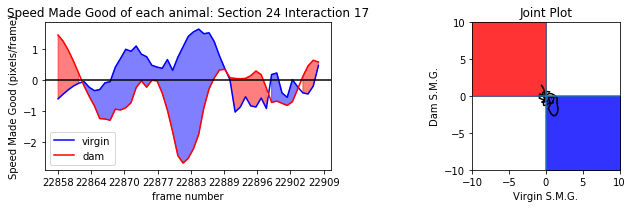

(23241, 23307)


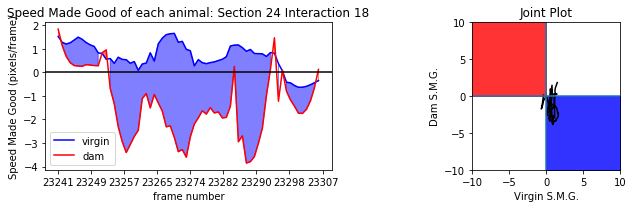

24
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(5770, 5821)


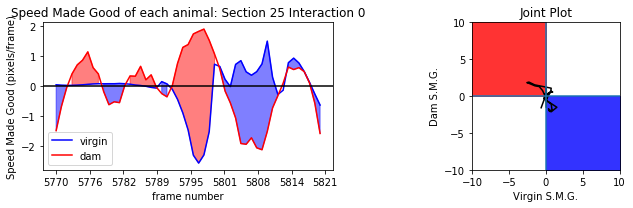

(5840, 5981)


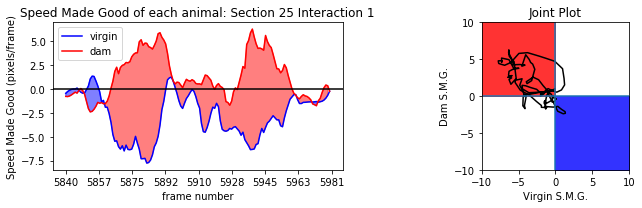

(6019, 6097)


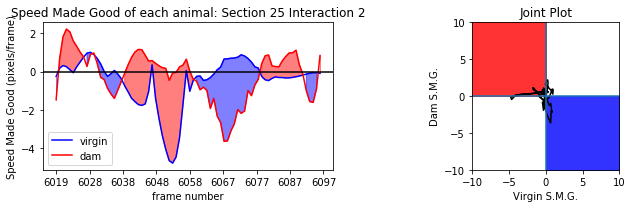

(6108, 6223)


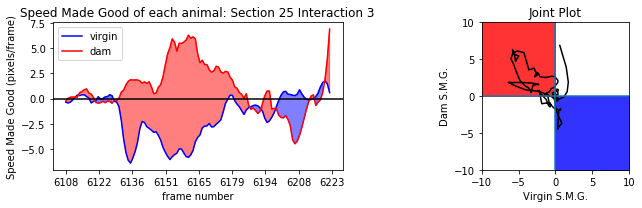

25
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(23155, 23204)


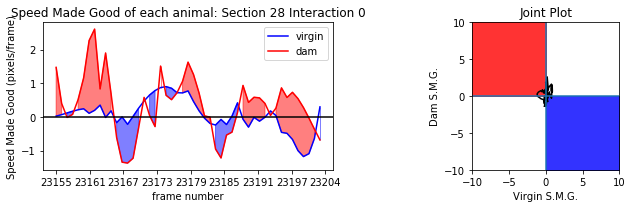

(23760, 23913)


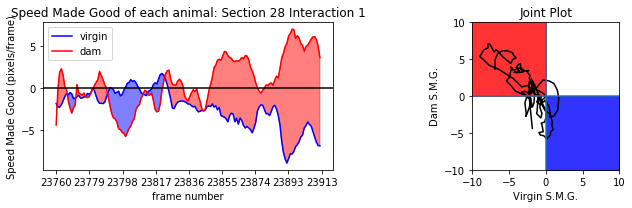

(30864, 30914)


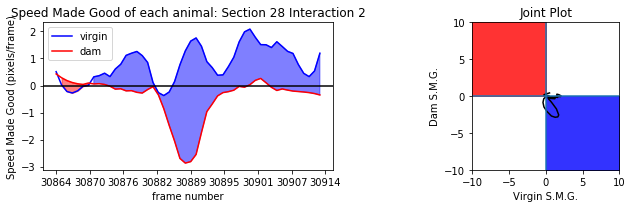

(31111, 31199)


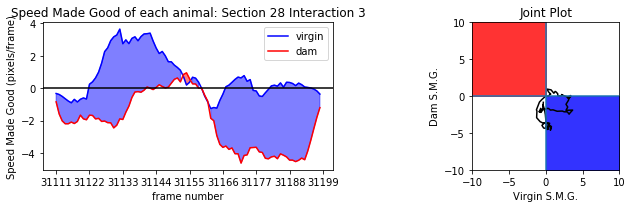

(33911, 34064)


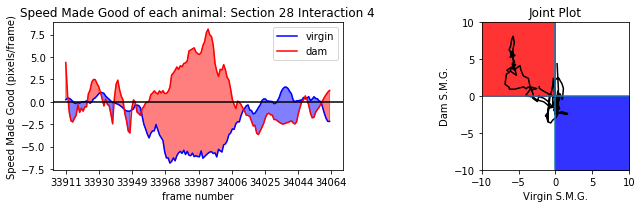

(34073, 34178)


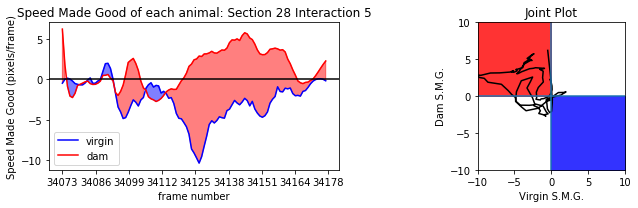

28
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))
(1340, 1400)


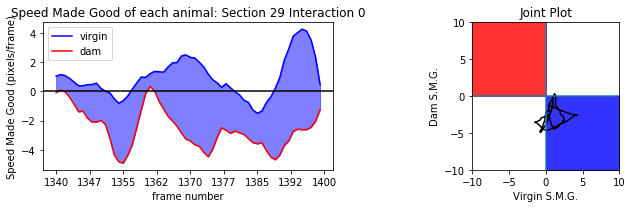

(1489, 1540)


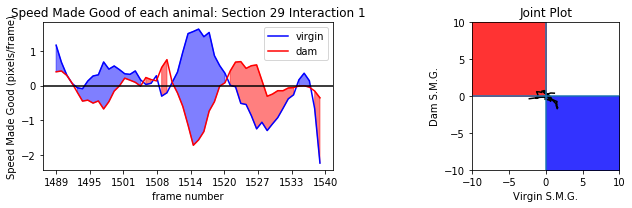

(1605, 1669)


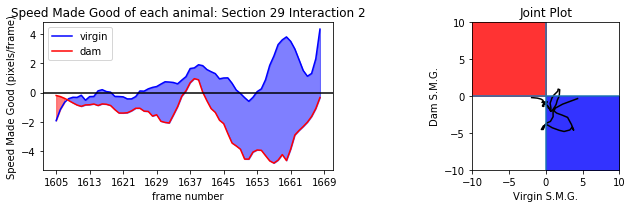

(1678, 1736)


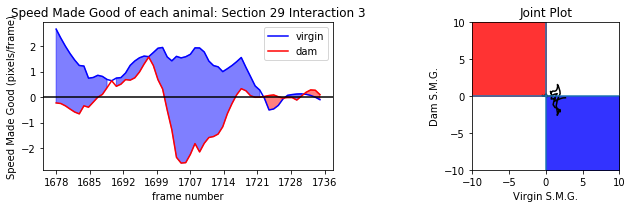

(1778, 1868)


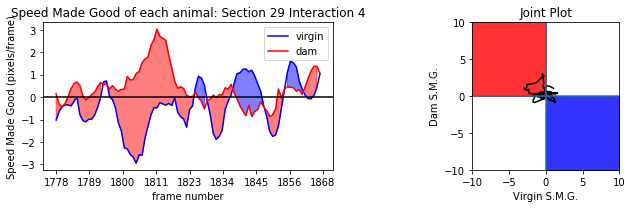

(3269, 3353)


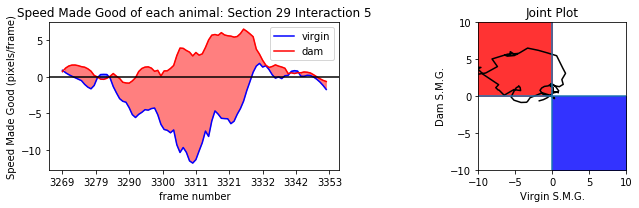

(3378, 3464)


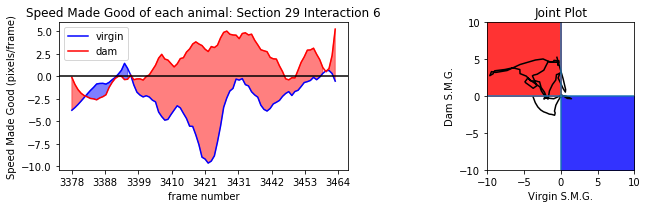

(5073, 5200)


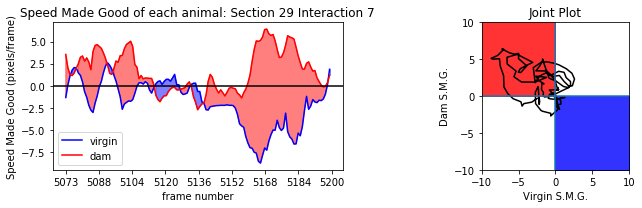

(6945, 6999)


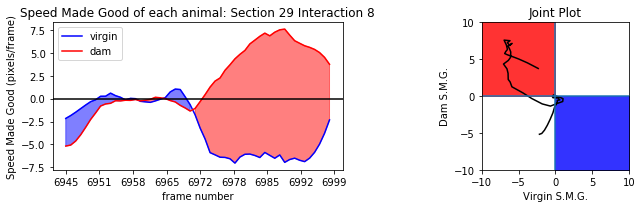

(7718, 7849)


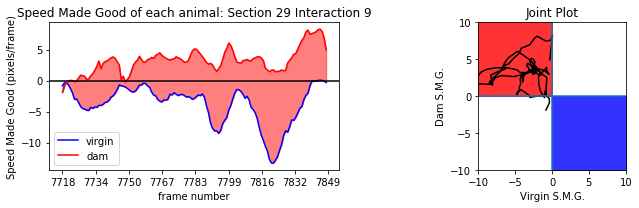

(14801, 14902)


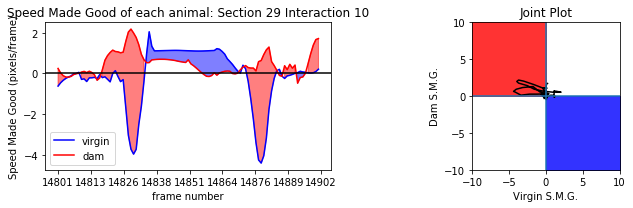

(17742, 17792)


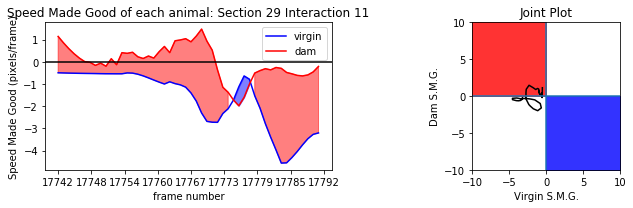

(23789, 23874)


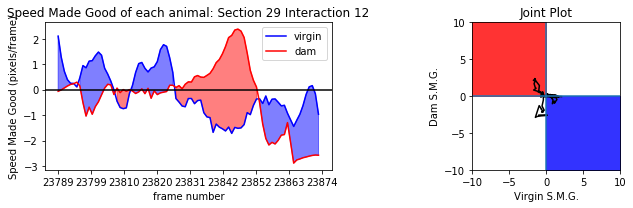

(30263, 30363)


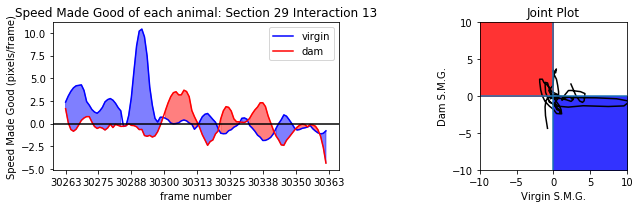

(30371, 30470)


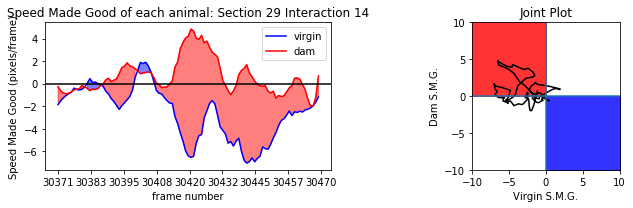

29
((35999, 2), (36000, 2))
((35999, 2), (36000, 2))


In [28]:
all_events = []
bufferlen = 50
all_crossplots = []

for i in range(30):
    rel_speedv = data[i].relative_speed(0)
    rel_speedm = data[i].relative_speed(1)
    ## Stipulate that at least one mouse is out of the nest:
    vnest = data[i].nest_ethogram(0)
    mnest = data[i].nest_ethogram(1)
    bnest = (~vnest*~mnest)
    ## Stipulate that the mice are close to each other: 
    close = [dist < 100 for dist in data[i].proximity()]
    smooth,leading = data[i].orderedtracking()
    smooth[abs(smooth)> 16] = np.nan
    criteria = smooth*bnest[:-1]*close[:-1]
    
    ## Find the trajectory at appropriate time points:
    trajs = data[i].render_trajectories([0,3,5,8])
    criteria_binary = criteria>2
    criteria_smooth = binary_dilation(criteria_binary,np.ones(50,))
    poi = np.where(criteria_smooth)[0]
    
    if len(poi):
        segs = find_segments(poi)
        events = np.zeros(len(segs),)

    
        for segind,seg in enumerate(segs):
            start,end = seg[0],seg[1]
            v_zoom = rel_speedv[np.max((start,0)):end]
            m_zoom = rel_speedm[np.max((start,0)):end]
            v_zoom[1:][(np.diff(v_zoom)>10)] = 0
            m_zoom[1:][(np.diff(v_zoom)>10)] = 0
            print(start,end)
            v_smoothedzoom = savgol_filter(v_zoom,11,3)
            m_smoothedzoom = savgol_filter(m_zoom,11,3)
#             plt.plot(v_smoothedzoom,color = 'blue',label = 'virgin')
#             plt.plot(m_smoothedzoom,color = 'red',label = 'dam')
#             plt.fill_between(range(len(v_smoothedzoom)),
#                              m_smoothedzoom,
#                              v_smoothedzoom,
#                              color = 'blue',
#                              where = v_smoothedzoom>m_smoothedzoom,
#                              alpha = 0.5)
#             plt.fill_between(range(len(v_smoothedzoom)),
#                              v_smoothedzoom,
#                              m_smoothedzoom,
#                              color = 'red',
#                              where = v_smoothedzoom<m_smoothedzoom,
#                              alpha = 0.5)
#             plt.xticks(np.linspace(seg[0],seg[1],seg[1]-seg[0]+1))
#             plt.xlabel('frame number')
#             plt.ylabel('Speed Made Good (pixels/frame)')
#             plt.title('Speed Made Good of each animal: Section '+str(i)+' Interaction '+str(segind))
# #             plt.plot(savgol_filter(m_zoom,11,3),color = 'red',label = 'dam')
#             plt.axhline(y = 0,color = 'black')
#             plt.legend()
#             plt.show()
#             plt.plot(v_smoothedzoom,m_smoothedzoom,color = 'black')
#             crossplot = np.stack((v_smoothedzoom,m_smoothedzoom),axis = -1)
#             plt.axvline(x = 0)
#             plt.axhline(y = 0)
#             plt.xlim([-10,10])
#             plt.ylim([-10,10])
#             plt.fill_between(np.linspace(-10,0),0,10,color = 'red')
#             plt.fill_between(np.linspace(0,10),-10,0,color = 'blue')
#             plt.show()
            fig,ax = plt.subplots(1,2,figsize = (10,3))
            ax[0].plot(v_smoothedzoom,color = 'blue',label = 'virgin')
            ax[0].plot(m_smoothedzoom,color = 'red',label = 'dam')
            ax[0].fill_between(range(len(v_smoothedzoom)),
                             m_smoothedzoom,
                             v_smoothedzoom,
                             color = 'blue',
                             where = v_smoothedzoom>m_smoothedzoom,
                             alpha = 0.5)
            ax[0].fill_between(range(len(v_smoothedzoom)),
                             v_smoothedzoom,
                             m_smoothedzoom,
                             color = 'red',
                             where = v_smoothedzoom<m_smoothedzoom,
                             alpha = 0.5)
            ax[0].set_xticks(np.round(np.linspace(0,seg[1]-seg[0],9), 2))
            ax[0].set_xticklabels(np.linspace(seg[0],seg[1],9).astype(int))
            ax[0].set_xlabel('frame number')
            ax[0].set_ylabel('Speed Made Good (pixels/frame)')
            ax[0].set_title('Speed Made Good of each animal: Section '+str(i)+' Interaction '+str(segind))
#             plt.plot(savgol_filter(m_zoom,11,3),color = 'red',label = 'dam')
            ax[0].axhline(y = 0,color = 'black')
            ax[0].legend()
      
            ax[1].plot(v_smoothedzoom,m_smoothedzoom,color = 'black')
            crossplot = np.stack((v_smoothedzoom,m_smoothedzoom),axis = -1)
            ax[1].axvline(x = 0)
            ax[1].axhline(y = 0)
            ax[1].set_xlim([-10,10])
            ax[1].set_ylim([-10,10])
            ax[1].fill_between(np.linspace(-10,0),0,10,color = 'red',alpha = 0.8)
            ax[1].fill_between(np.linspace(0,10),-10,0,color = 'blue',alpha = 0.8)
            ax[1].set_title('Joint Plot')
            ax[1].set_aspect('equal')
            ax[1].set_xlabel('Virgin S.M.G.')
            ax[1].set_ylabel('Dam S.M.G.')
            plt.tight_layout()
            plt.savefig('./all_interactions/'+'Speed Made Good of each animal: Section '+str(i)+' Interaction '+str(segind))
            plt.show()
            events[segind] = np.sum(v_zoom-m_zoom)/(end-start)
            all_crossplots.append(crossplot)
#         all_crossplotarray = np.concatenate(all_crossplots)
#         counts,x,y = np.histogram2d(all_crossplotarray[:,0],all_crossplotarray[:,1],bins = 20)
#         plt.imshow(counts,interpolation='nearest', origin='low',extent=[-10, 10, -10, 10])
#         plt.show()
        all_events.append(events)
        print(i)

        poi_onehot = [j in poi for j in range(36000)]
        cuts = [traj[poi,:] for traj in trajs]



        rel_speedv = data[i].relative_speed(0)
        relspeedsv = [rel_speedv[loc-100:loc+100] for loc in poi]
        rel_speedm = data[i].relative_speed(1)
        relspeedsm = [rel_speedm[loc-100:loc+100] for loc in poi]

    else:
        all_events.append(np.zeros((2)))



In [29]:
#### Now analyze the crossplots:
## A record of all interactions, indexed by interaction. 

## Split into dam 'incharge' and virgin 'incharge' moments. 
dam_ints = []
virg_ints = []
for interaction in all_crossplots:
    vint = interaction[(interaction[:,0]-interaction[:,1])>0,:]
    dint = interaction[(interaction[:,0]-interaction[:,1])<0,:]

    virg_ints.append(vint)

    dam_ints.append(dint)

In [31]:
len(virg_ints)

197

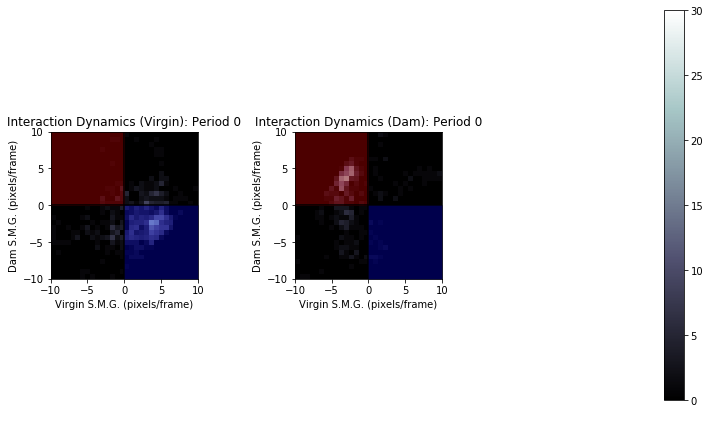

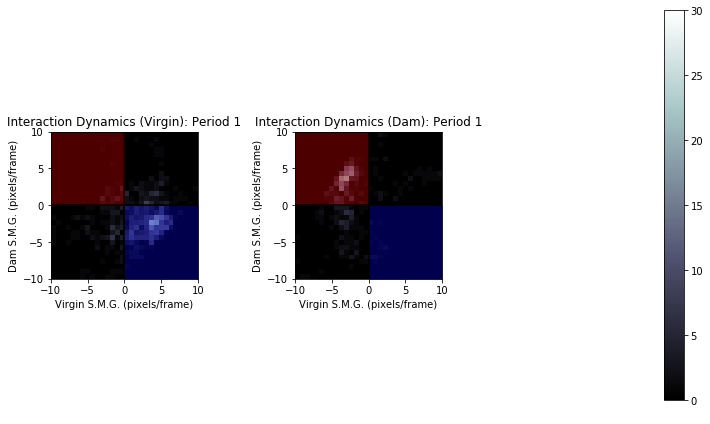

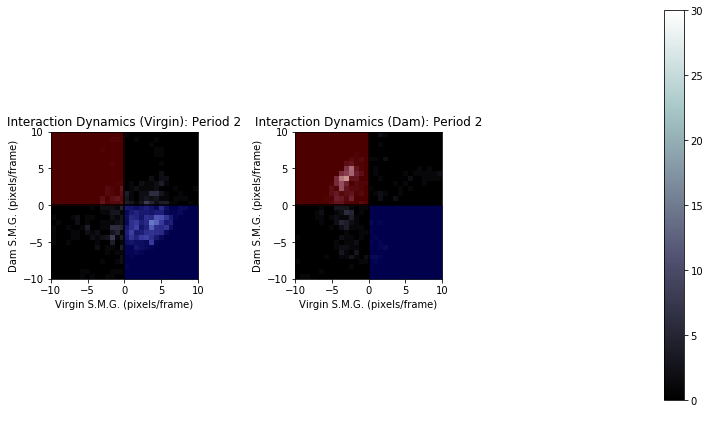

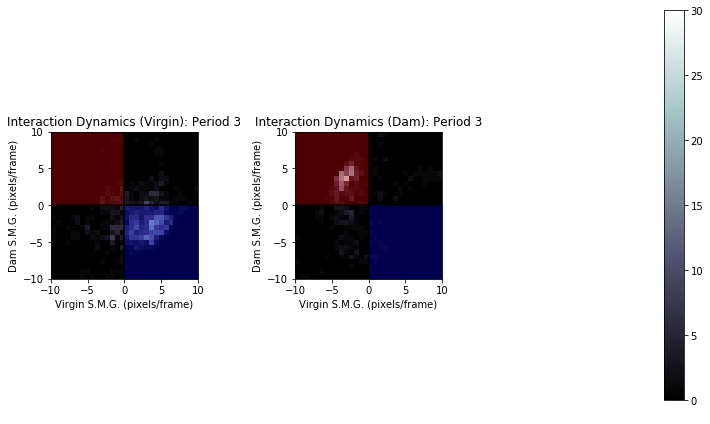

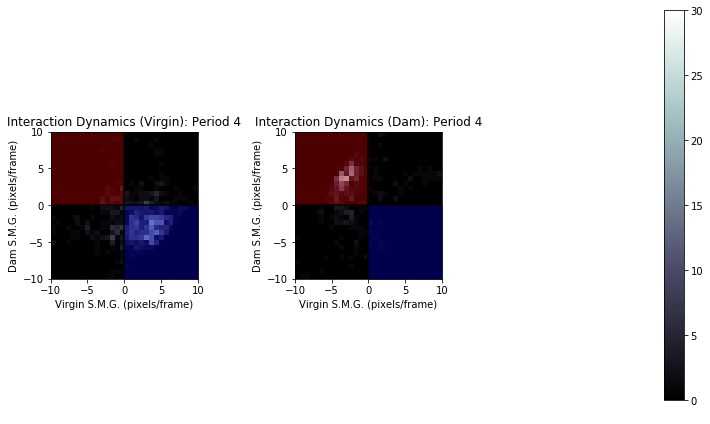

...

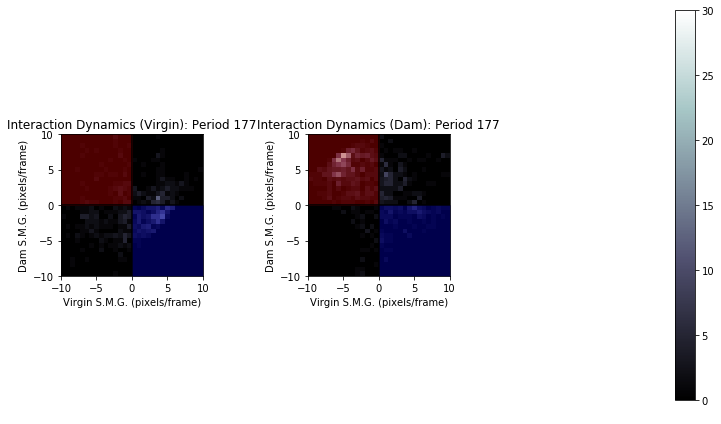

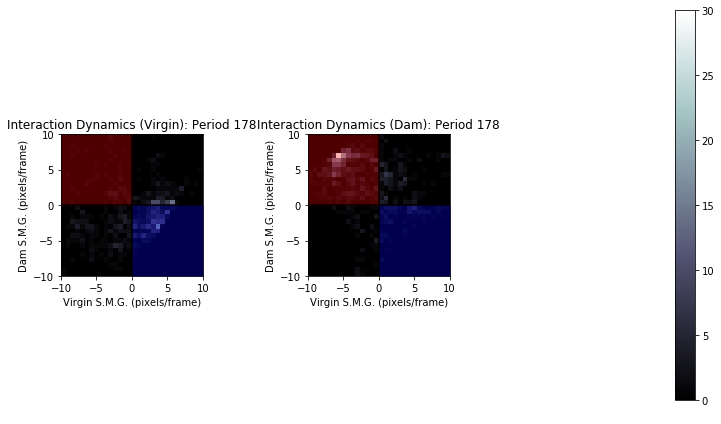

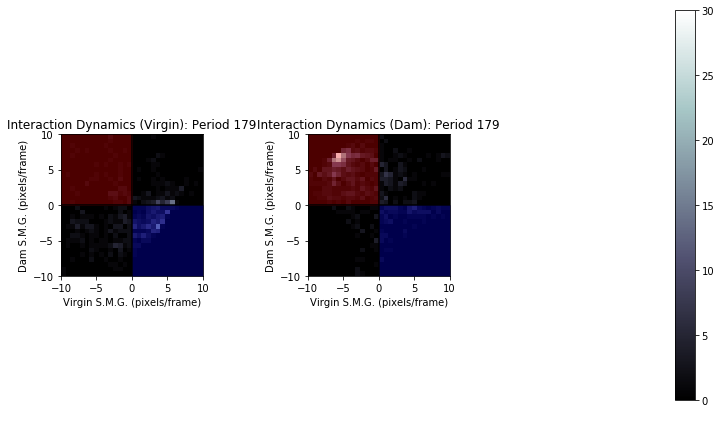

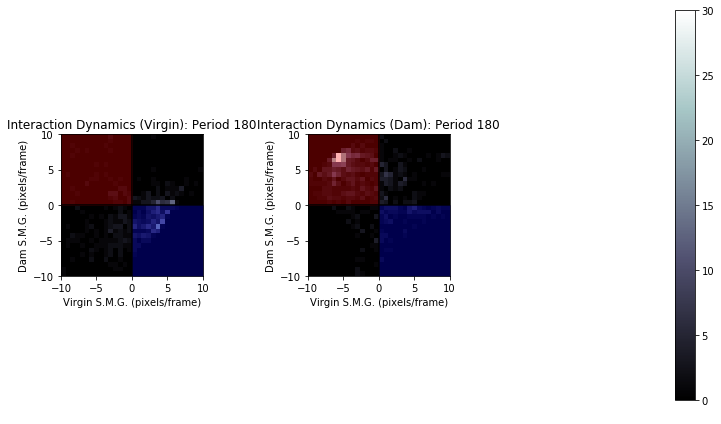

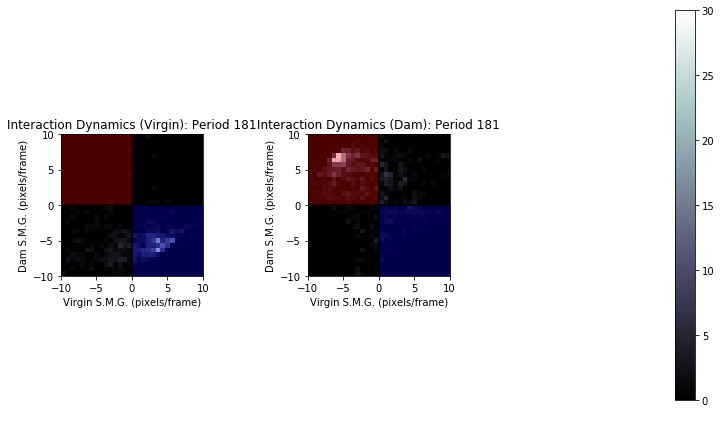

In [35]:
int_window = 15
for i in range(len(virg_ints)-int_window):
    ints_tocheck = np.arange(int_window)+i
    ## collect relevant data:
    vdatawindow = np.concatenate([virg_ints[ind] for ind in ints_tocheck if len(virg_ints[ind])],axis = 0)
    ddatawindow = np.concatenate([dam_ints[ind] for ind in ints_tocheck if len(dam_ints[ind])],axis = 0)
    vcounts,x,y = np.histogram2d(vdatawindow[:,0],vdatawindow[:,1],bins = 30)
    dcounts,x,y = np.histogram2d(ddatawindow[:,0],ddatawindow[:,1],bins = 30)
    fig,ax = plt.subplots(1,3,figsize = (10,6))
    im0 = ax[0].imshow(vcounts,interpolation='nearest',
                 origin='low',
                 extent=[-10, 10, -10, 10],
                 vmin = 0,
                 vmax = 30,
                 cmap = plt.cm.bone
                )
    im1 = ax[1].imshow(dcounts,interpolation='nearest',
                 origin='low',
                 extent=[-10, 10, -10, 10],
                 vmin = 0,
                 vmax = 30,
                 cmap = plt.cm.bone
                )

    [ax[j].axvline(x = 0,color = 'black') for j in range(2)]
    [ax[j].axhline(y = 0,color = 'black') for j in range(2)]
    [ax[j].fill_between(np.linspace(-10,0),0,10,color = 'red',alpha = 0.3) for j in range(2)]
    [ax[j].fill_between(np.linspace(0,10),-10,0,color = 'blue',alpha = 0.3) for j in range(2)]    
#     caxes = ax[2].set_axes([0,0,1,2])
    ax[2].axis('off')
    plt.colorbar(im1)
    
    ax[0].set_xlabel('Virgin S.M.G. (pixels/frame)')
    ax[1].set_xlabel('Virgin S.M.G. (pixels/frame)')
    ax[0].set_ylabel('Dam S.M.G. (pixels/frame)')
    ax[1].set_ylabel('Dam S.M.G. (pixels/frame)')
    ax[0].set_title('Interaction Dynamics (Virgin): Period '+str(i))
    ax[1].set_title('Interaction Dynamics (Dam): Period '+str(i))
    
    plt.tight_layout()
    plt.savefig('./all_interactions/'+'Interaction_Dynamics_Period_'+str(i))
    plt.show()

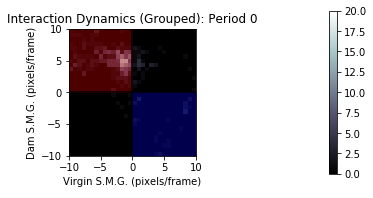

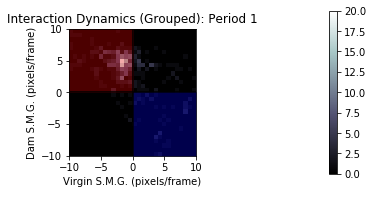

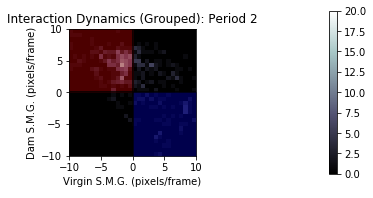

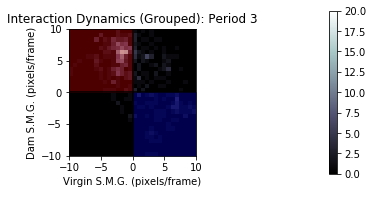

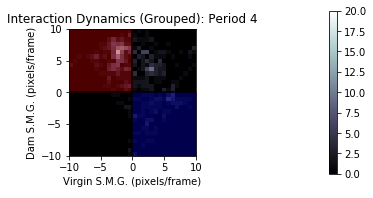

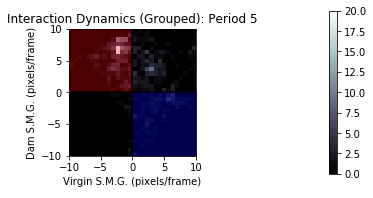

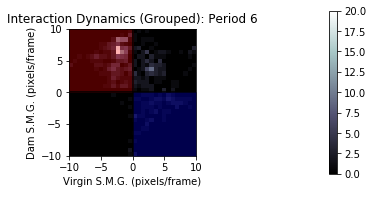

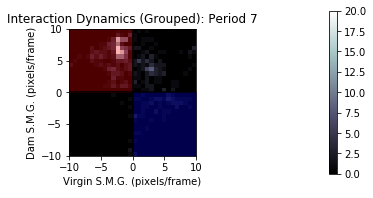

KeyboardInterrupt: 

In [355]:
int_window = 6
for i in range(len(virg_ints)-int_window+1):
    ints_tocheck = np.arange(int_window)+i
    ## collect relevant data:
    adatawindow = np.concatenate([all_crossplots[ind] for ind in ints_tocheck if len(all_crossplots)],axis = 0)
#     ddatawindow = np.concatenate([dam_ints[ind] for ind in ints_tocheck if len(dam_ints[ind])],axis = 0)
    acounts,x,y = np.histogram2d(adatawindow[:,0],adatawindow[:,1],bins = 30)
#     dcounts,x,y = np.histogram2d(ddatawindow[:,0],ddatawindow[:,1],bins = 30)
    fig,ax = plt.subplots(1,2,figsize = (5,3))
    im2 = ax[0].imshow(acounts,interpolation='nearest',
                 origin='low',
                 extent=[-10, 10, -10, 10],
                 vmin = 0,
                 vmax = 20,
                 cmap = plt.cm.bone
                )
   
    ax[0].axvline(x = 0,color = 'black')
    ax[0].axhline(y = 0,color = 'black')
    ax[0].fill_between(np.linspace(-10,0),0,10,color = 'red',alpha = 0.3)
    ax[0].fill_between(np.linspace(0,10),-10,0,color = 'blue',alpha = 0.3)
    ax[1].axis('off')
    plt.colorbar(im2)
    
    ax[0].set_xlabel('Virgin S.M.G. (pixels/frame)')
    ax[0].set_ylabel('Dam S.M.G. (pixels/frame)')
    ax[0].set_title('Interaction Dynamics (Grouped): Period '+str(i))
    plt.savefig('./all_interactions/'+'Interaction Dynamics Grouped: Period '+str(i))
    plt.show()

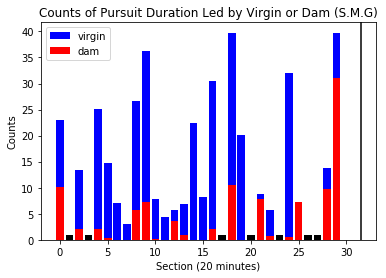

In [196]:
# plt.plot(np.concatenate(all_events))
all_energy = []
virg_energy = []
moth_energy = []
for i in range(30):
    events = all_events[i]
    pos = events[np.where(events>0)]
    neg = events[np.where(events<=0)]
    energy = np.sum(pos)-np.sum(neg)
    all_energy.append(energy)
    virg_energy.append(np.sum(pos))
    moth_energy.append(-np.sum(neg))
    
all_energy = np.array(all_energy)
moth_energy = np.array(moth_energy)
plt.bar(np.arange(30),all_energy,color = 'blue',label = 'virgin')
plt.bar(np.arange(30),moth_energy+virg_energy == 0,color = 'black')
plt.bar(np.arange(30),moth_energy,color = 'red',label = 'dam')
plt.xlabel('Section (20 minutes)')
plt.ylabel('Counts')
plt.title('Counts of Pursuit Duration Led by Virgin or Dam (S.M.G)')
plt.xticks(np.arange(35)[::5])
plt.axvline(x = 31.5,color = 'black')
plt.legend()
plt.savefig('count_duration_smg.png')
plt.show()

((15779, 2), (15780, 2))
((15779, 2), (15780, 2))
14
(485, 545)


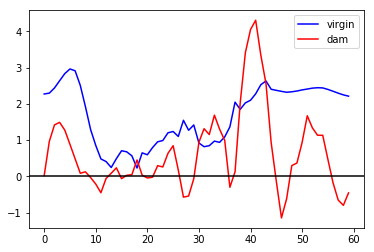

(603, 722)


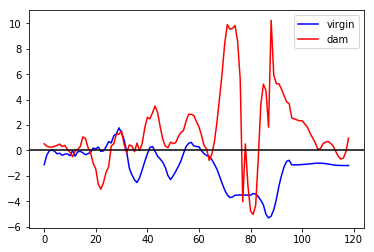

(1831, 1914)


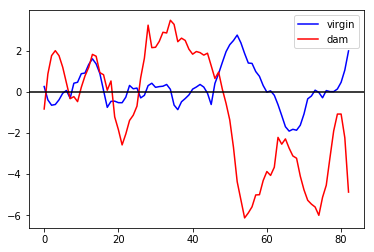

(3507, 3577)


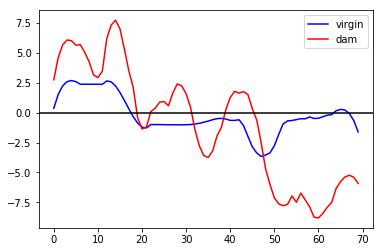

(4419, 4470)


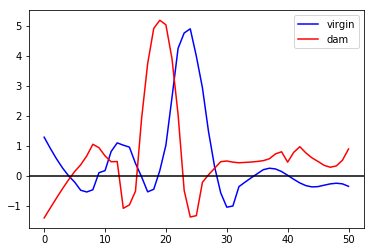

(4483, 4737)


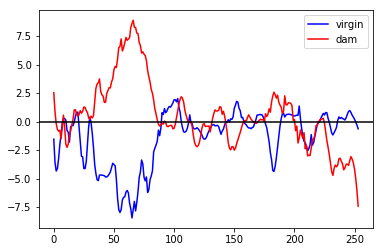

(6633, 6714)


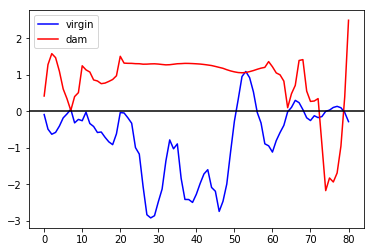

(7169, 7277)


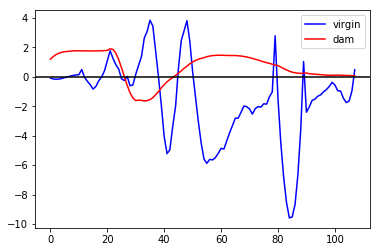

(7995, 8045)


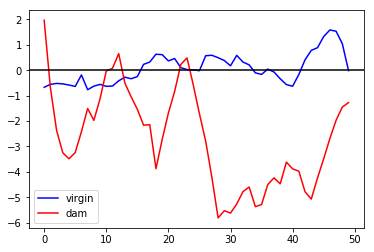

(8104, 8159)


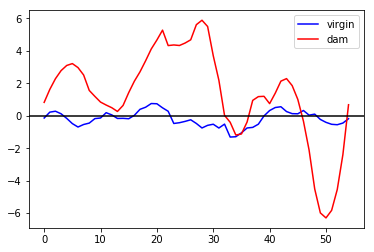

(8191, 8284)


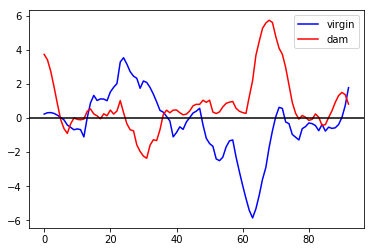

(8382, 8543)


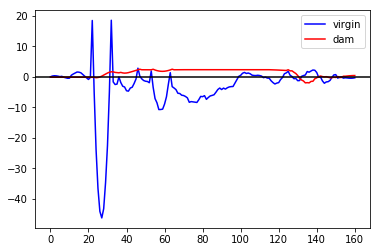

(8659, 8709)


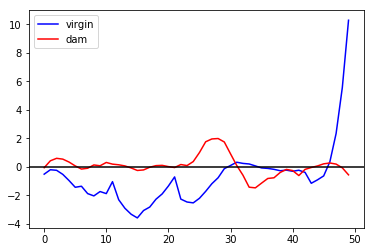

(8894, 9001)


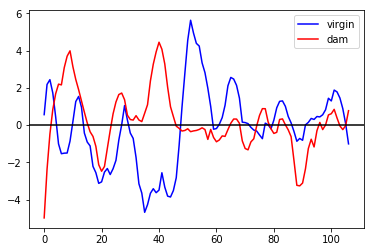

7


In [27]:
dead_events = [17,20,23,26,27]
all_events = []
example_later.bounds = (210,300)
rel_speedv = example_later.relative_speed(0)
rel_speedm = example_later.relative_speed(1)
events = np.zeros(example_later.dataset.shape)
## Stipulate that at least one mouse is out of the nest:
vnest = example_later.nest_ethogram(0)
mnest = example_later.nest_ethogram(1)
bnest = (~vnest*~mnest)
## Stipulate that the mice are close to each other: 
close = [dist < 100 for dist in example_later.proximity()]
smooth,leading = example_later.orderedtracking()
smooth[abs(smooth)> 16] = np.nan
criteria = smooth*bnest[:-1]*close[:-1]

criteria_binary = criteria>2

criteria_smooth = binary_dilation(criteria_binary,np.ones(50,))

## Find the trajectory at appropriate time points:
trajs = example_later.render_trajectories([0,3,5,8])
poi = np.where(criteria_smooth)[0]
all_crosschecks = []
if len(poi):
    segs = find_segments(poi)
    print(len(segs))
    events = np.zeros((len(segs),2))


    for segind,seg in enumerate(segs):
        start,end = seg[0],seg[1]
        v_zoom = rel_speedv[np.max((start,0)):end]
        m_zoom = rel_speedm[np.max((start,0)):end]
        v_zoom[1:][(np.diff(v_zoom)>10)] = 0
        m_zoom[1:][(np.diff(v_zoom)>10)] = 0
        print(start,end)
        v_smoothedzoom = savgol_filter(v_zoom,11,3)
        m_smoothedzoom = savgol_filter(m_zoom,11,3)
        plt.plot(v_smoothedzoom,color = 'blue',label = 'virgin')
        plt.plot(m_smoothedzoom,color = 'red',label = 'dam')

#             plt.plot(savgol_filter(m_zoom,11,3),color = 'red',label = 'dam')
        plt.axhline(y = 0,color = 'black')
        plt.legend()
        plt.show()
        all_crosschecks.append(np.stack([v_smoothedzoom,m_smoothedzoom],-1))
#         plt.plot(v_smoothedzoom,m_smoothedzoom)
#         plt.axvline(x = 0)
#         plt.axhline(y = 0)
#         plt.show()
        events[segind] = np.sum(v_zoom-m_zoom)/(end-start)

    all_events.append(events)


    poi_onehot = [j in poi for j in range(36000)]
    cuts = [traj[poi,:] for traj in trajs]
#     fig,ax = plt.subplots(2)

#     [ax[0].plot(cut[:,0],cut[:,1]) for cut in cuts]
#     ax[0].set_aspect('equal')
#     ax[1].plot(criteria)
    print(i)

#     rel_speedv = data[i].relative_speed(0)
#     relspeedsv = [rel_speedv[loc-100:loc+100] for loc in poi]
#     rel_speedm = data[i].relative_speed(1)
#     relspeedsm = [rel_speedm[loc-100:loc+100] for loc in poi]
#     for locind in range(len(poi)):
#         plt.plot(relspeedsv[locind])
#         plt.plot(relspeedsm[locind])
#         plt.show()
#     if i in [0,9,13,19,29]:
#         plt.plot(relspeedsv[locind])
#         plt.plot(relspeedsm[locind])
#         plt.show()
#         print('makingvid')
#         try:
#             data[i].import_movie(path+str(i)+'.mp4')
#             data[i].highlights_reel(str(i)+'pursuits',poi_onehot,buffer = 50)
#         except:
#             print('movietroubles')
#     plt.show()
else:
    all_events.append(np.zeros((1,2)))

In [384]:
np.sum(events[events<=0])

-0.2960525985608651

In [385]:
c,x,y = np.histogram2d()

TypeError: histogram2d() takes at least 2 arguments (0 given)

In [43]:
len(all_crosschecks)

14

In [44]:
#### Now analyze the crossplots:
## A record of all interactions, indexed by interaction. 

## Split into dam 'incharge' and virgin 'incharge' moments. 
dam_ints = []
virg_ints = []
for interaction in all_crosschecks:
    vint = interaction[(interaction[:,0]-interaction[:,1])>0,:]
    dint = interaction[(interaction[:,0]-interaction[:,1])<0,:]

    virg_ints.append(vint)

    dam_ints.append(dint)
    

In [45]:
print(len(virg_ints[1]))

20


((15779, 2), (15780, 2))
((15779, 2), (15780, 2))
(array([ 4,  4,  4,  4,  1,  4,  4,  4,  5,  4,  5,  4,  4,  4,  4,  1,  4,
        4,  5,  6,  4,  4,  5,  5,  5,  8,  8,  8, 10,  8]), array([10, 15, 15, 19, 22, 23, 23, 21, 25, 24, 19, 19, 23,  0,  0,  0,  0,
        0, 21,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 22]))


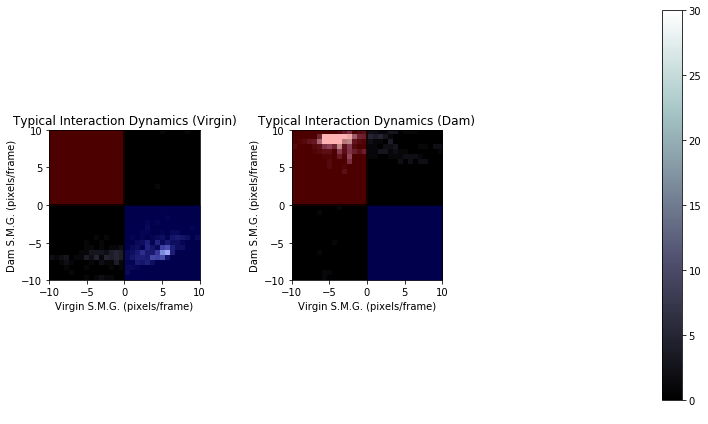

In [49]:
int_window = 13
for i in range(len(virg_ints)-int_window):
    rel_speedv = example_later.relative_speed(0)
    rel_speedm = example_later.relative_speed(1)
    ints_tocheck = np.arange(int_window)+i
    ## collect relevant data:
    vdatawindow = np.concatenate([virg_ints[ind] for ind in ints_tocheck if len(virg_ints[ind])],axis = 0)
    ddatawindow = np.concatenate([dam_ints[ind] for ind in ints_tocheck if len(dam_ints[ind])],axis = 0)
    vcounts,x,y = np.histogram2d(vdatawindow[:,0],vdatawindow[:,1],bins = 30)
    dcounts,x,y = np.histogram2d(ddatawindow[:,0],ddatawindow[:,1],bins = 30)
    fig,ax = plt.subplots(1,3,figsize = (10,6))
    print(np.argmax(vcounts,axis = 0),np.argmax(vcounts,axis = 1))
    im0 = ax[0].imshow(vcounts,interpolation='nearest',
                 origin='low',
                 extent=[-10, 10, -10, 10],
                 vmin = 0,
                 vmax = 30,
                 cmap = plt.cm.bone
                )
    im1 = ax[1].imshow(dcounts,interpolation='nearest',
                 origin='low',
                 extent=[-10, 10, -10, 10],
                 vmin = 0,
                 vmax = 30,
                 cmap = plt.cm.bone
                )

    [ax[j].axvline(x = 0,color = 'black') for j in range(2)]
    [ax[j].axhline(y = 0,color = 'black') for j in range(2)]
    [ax[j].fill_between(np.linspace(-10,0),0,10,color = 'red',alpha = 0.3) for j in range(2)]
    [ax[j].fill_between(np.linspace(0,10),-10,0,color = 'blue',alpha = 0.3) for j in range(2)]    
#     caxes = ax[2].set_axes([0,0,1,2])
    ax[2].axis('off')
    plt.colorbar(im1)
    
    ax[0].set_xlabel('Virgin S.M.G. (pixels/frame)')
    ax[1].set_xlabel('Virgin S.M.G. (pixels/frame)')
    ax[0].set_ylabel('Dam S.M.G. (pixels/frame)')
    ax[1].set_ylabel('Dam S.M.G. (pixels/frame)')
    ax[0].set_title('Typical Interaction Dynamics (Virgin)')
    ax[1].set_title('Typical Interaction Dynamics (Dam)')
    
    plt.tight_layout()
    plt.savefig('./all_interactions/'+'Interaction Dynamics Later')
    plt.show()

In [53]:
data[29].import_movie(path+'29.mp4')

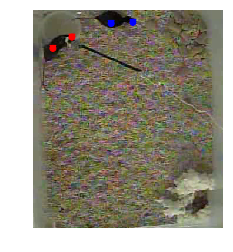

In [56]:
data[29].plot_image_compare([0,3,5,8],2000)

S.M.G.$(i,j)$ = speed of agent $i$ in direction of agent $j$


In [6]:
test_data = [data[0],data[9],data[13],data[19],data[29]]
## Search over skips: 
alldata = []
for skip in [2,4,8,16]:
    data0 = []
    for windowlength in [10,25,40,55]:
        print(windowlength)
        data1 = []
        for varthresh in [10,25,40,55]:
            data2 = []
            for thresh in [[2,2],[3,2],[5,2],[8,2]]:
                data3 = []
                for dataset in test_data:
                    dataset.reset_filters([i for i in range(10)])
                    dataset.filter_check_replace_p([i for i in range(10)],windowlength,varthresh,skip)
                    dataset.filter_crosscheck_replaces_v2([j for j in range(10)],vstats,mstats,thresh)
                    dataset.filter_segment_replaces([k for k in range(5)])
                    out = dataset.render_trajectories([w for w in range(10)])
                    data3.append(out)
                data2.append(data3)
            data1.append(data2)
        data0.append(data1)
    alldata.append(data0)
  






  1%|          | 114/17994 [00:00<00:15, 1135.99it/s]

10
resetting filters...


  1%|          | 129/17994 [00:00<00:13, 1283.79it/s]

resetting filters...


  1%|          | 110/17994 [00:00<00:16, 1091.03it/s]

resetting filters...


  1%|          | 137/17994 [00:00<00:13, 1361.98it/s]

resetting filters...


  1%|          | 123/17994 [00:00<00:14, 1229.94it/s]

resetting filters...


  1%|          | 123/17994 [00:00<00:14, 1220.29it/s]

resetting filters...


  1%|          | 124/17994 [00:00<00:14, 1235.03it/s]

resetting filters...


  1%|          | 131/17994 [00:00<00:13, 1302.06it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1397.82it/s]

resetting filters...


  1%|          | 138/17994 [00:00<00:13, 1371.77it/s]

resetting filters...


  1%|          | 113/17994 [00:00<00:15, 1123.91it/s]

resetting filters...


  1%|          | 130/17994 [00:00<00:13, 1297.19it/s]

resetting filters...


  1%|          | 132/17994 [00:00<00:13, 1314.59it/s]

resetting filters...


  1%|          | 106/17994 [00:00<00:16, 1053.80it/s]

resetting filters...


  1%|          | 129/17994 [00:00<00:13, 1281.94it/s]

resetting filters...


  1%|          | 127/17994 [00:00<00:14, 1269.96it/s]

resetting filters...


  1%|          | 130/17994 [00:00<00:13, 1293.92it/s]

resetting filters...


  1%|          | 134/17994 [00:00<00:13, 1332.65it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1383.14it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1355.33it/s]

resetting filters...


  1%|          | 131/17994 [00:00<00:13, 1303.61it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1352.71it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1357.53it/s]

resetting filters...


  1%|          | 141/17994 [00:00<00:12, 1403.91it/s]

resetting filters...


  1%|          | 144/17994 [00:00<00:12, 1433.33it/s]

resetting filters...


  1%|          | 135/17994 [00:00<00:13, 1346.70it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1386.87it/s]

resetting filters...


  1%|          | 143/17994 [00:00<00:12, 1422.18it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1394.56it/s]

resetting filters...


  1%|          | 143/17994 [00:00<00:12, 1429.36it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1350.87it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1354.28it/s]

resetting filters...


  1%|          | 138/17994 [00:00<00:12, 1378.11it/s]

resetting filters...


  1%|          | 144/17994 [00:00<00:12, 1438.19it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1398.50it/s]

resetting filters...


  1%|          | 131/17994 [00:00<00:13, 1309.61it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1387.90it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1399.29it/s]

resetting filters...


  1%|          | 145/17994 [00:00<00:12, 1443.97it/s]

resetting filters...


  1%|          | 143/17994 [00:00<00:12, 1420.78it/s]

resetting filters...


  1%|          | 137/17994 [00:00<00:13, 1367.25it/s]

resetting filters...


  1%|          | 141/17994 [00:00<00:12, 1407.44it/s]

resetting filters...


  1%|          | 143/17994 [00:00<00:12, 1420.38it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1384.99it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1389.10it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1354.49it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1391.43it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1396.66it/s]

resetting filters...


  0%|          | 86/17994 [00:00<00:20, 859.37it/s]

resetting filters...


  1%|          | 144/17994 [00:00<00:12, 1435.95it/s]

resetting filters...


  1%|          | 138/17994 [00:00<00:13, 1372.16it/s]

resetting filters...


  1%|          | 136/17994 [00:00<00:13, 1356.77it/s]

resetting filters...


  1%|          | 141/17994 [00:00<00:12, 1407.48it/s]

resetting filters...


  0%|          | 82/17994 [00:00<00:21, 814.78it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1385.91it/s]

resetting filters...


  1%|          | 132/17994 [00:00<00:13, 1315.65it/s]

resetting filters...


  1%|          | 141/17994 [00:00<00:12, 1400.92it/s]

resetting filters...


  1%|          | 142/17994 [00:00<00:12, 1415.92it/s]

resetting filters...


  1%|          | 145/17994 [00:00<00:12, 1448.62it/s]

resetting filters...


  1%|          | 142/17994 [00:00<00:12, 1411.36it/s]

resetting filters...


  1%|          | 137/17994 [00:00<00:13, 1366.75it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1390.55it/s]

resetting filters...


  1%|          | 141/17994 [00:00<00:12, 1401.52it/s]

resetting filters...


  1%|          | 145/17994 [00:00<00:12, 1448.78it/s]

resetting filters...


  1%|          | 142/17994 [00:00<00:12, 1419.97it/s]

resetting filters...


  1%|          | 138/17994 [00:00<00:12, 1376.78it/s]

resetting filters...


  1%|          | 139/17994 [00:00<00:12, 1384.26it/s]

resetting filters...


  1%|          | 141/17994 [00:00<00:12, 1408.69it/s]

resetting filters...


  1%|          | 144/17994 [00:00<00:12, 1431.98it/s]

resetting filters...


  1%|          | 142/17994 [00:00<00:12, 1413.51it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1394.19it/s]

resetting filters...


  1%|          | 130/17994 [00:00<00:13, 1294.47it/s]

resetting filters...


  1%|          | 143/17994 [00:00<00:12, 1425.60it/s]

resetting filters...


  1%|          | 143/17994 [00:00<00:12, 1424.26it/s]

resetting filters...


  1%|          | 138/17994 [00:00<00:12, 1378.83it/s]

resetting filters...


  1%|          | 135/17994 [00:00<00:13, 1344.94it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1394.87it/s]

resetting filters...


  1%|          | 145/17994 [00:00<00:12, 1447.55it/s]

resetting filters...


  1%|          | 144/17994 [00:00<00:12, 1438.66it/s]

resetting filters...


  1%|          | 140/17994 [00:00<00:12, 1397.23it/s]

resetting filters...


  1%|          | 115/17987 [00:00<00:15, 1142.44it/s]

25
resetting filters...


  1%|          | 123/17987 [00:00<00:14, 1222.57it/s]

resetting filters...


  1%|          | 125/17987 [00:00<00:14, 1247.51it/s]

resetting filters...


  1%|          | 136/17987 [00:00<00:13, 1350.69it/s]

resetting filters...


  1%|          | 125/17987 [00:00<00:14, 1245.78it/s]

resetting filters...


  1%|          | 117/17987 [00:00<00:15, 1160.45it/s]

resetting filters...


  1%|          | 117/17987 [00:00<00:15, 1168.19it/s]

resetting filters...


  1%|          | 126/17987 [00:00<00:14, 1253.48it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1368.77it/s]

resetting filters...


  1%|          | 131/17987 [00:00<00:13, 1305.90it/s]

resetting filters...


  1%|          | 115/17987 [00:00<00:15, 1147.11it/s]

resetting filters...


  1%|          | 120/17987 [00:00<00:14, 1194.58it/s]

resetting filters...


  1%|          | 124/17987 [00:00<00:14, 1231.39it/s]

resetting filters...


  1%|          | 138/17987 [00:00<00:12, 1375.58it/s]

resetting filters...


  1%|          | 111/17987 [00:00<00:16, 1104.95it/s]

resetting filters...


  1%|          | 112/17987 [00:00<00:15, 1118.05it/s]

resetting filters...


  1%|          | 120/17987 [00:00<00:14, 1194.41it/s]

resetting filters...


  0%|          | 66/17987 [00:00<00:27, 651.21it/s]

resetting filters...


  1%|          | 133/17987 [00:00<00:13, 1326.95it/s]

resetting filters...


  1%|          | 129/17987 [00:00<00:13, 1283.07it/s]

resetting filters...


  1%|          | 126/17987 [00:00<00:14, 1251.91it/s]

resetting filters...


  1%|          | 131/17987 [00:00<00:13, 1301.44it/s]

resetting filters...


  1%|          | 134/17987 [00:00<00:13, 1331.86it/s]

resetting filters...


  1%|          | 138/17987 [00:00<00:12, 1373.48it/s]

resetting filters...


  1%|          | 133/17987 [00:00<00:13, 1322.76it/s]

resetting filters...


  1%|          | 121/17987 [00:00<00:14, 1206.99it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1319.97it/s]

resetting filters...


  1%|          | 131/17987 [00:00<00:13, 1309.70it/s]

resetting filters...


  1%|          | 114/17987 [00:00<00:15, 1136.08it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1363.06it/s]

resetting filters...


  1%|          | 124/17987 [00:00<00:14, 1239.11it/s]

resetting filters...


  1%|          | 130/17987 [00:00<00:13, 1295.34it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1316.29it/s]

resetting filters...


  1%|          | 139/17987 [00:00<00:12, 1381.25it/s]

resetting filters...


  1%|          | 138/17987 [00:00<00:13, 1370.61it/s]

resetting filters...


  1%|          | 124/17987 [00:00<00:14, 1232.52it/s]

resetting filters...


  1%|          | 131/17987 [00:00<00:13, 1302.75it/s]

resetting filters...


  1%|          | 135/17987 [00:00<00:13, 1344.59it/s]

resetting filters...


  1%|          | 142/17987 [00:00<00:12, 1411.57it/s]

resetting filters...


  1%|          | 129/17987 [00:00<00:13, 1286.61it/s]

resetting filters...


  1%|          | 127/17987 [00:00<00:14, 1263.85it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1316.98it/s]

resetting filters...


  1%|          | 135/17987 [00:00<00:13, 1349.07it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1365.59it/s]

resetting filters...


  1%|          | 139/17987 [00:00<00:12, 1387.15it/s]

resetting filters...


  1%|          | 126/17987 [00:00<00:14, 1257.01it/s]

resetting filters...


  1%|          | 133/17987 [00:00<00:13, 1324.75it/s]

resetting filters...


  1%|          | 135/17987 [00:00<00:13, 1346.70it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1363.65it/s]

resetting filters...


  1%|          | 139/17987 [00:00<00:12, 1380.75it/s]

resetting filters...


  1%|          | 129/17987 [00:00<00:13, 1283.82it/s]

resetting filters...


  1%|          | 133/17987 [00:00<00:13, 1324.04it/s]

resetting filters...


  1%|          | 136/17987 [00:00<00:13, 1352.80it/s]

resetting filters...


  1%|          | 138/17987 [00:00<00:12, 1373.23it/s]

resetting filters...


  1%|          | 135/17987 [00:00<00:13, 1347.87it/s]

resetting filters...


  1%|          | 125/17987 [00:00<00:14, 1244.10it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1360.95it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1318.68it/s]

resetting filters...


  1%|          | 139/17987 [00:00<00:12, 1385.58it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1366.63it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1317.93it/s]

resetting filters...


  1%|          | 131/17987 [00:00<00:13, 1306.08it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1362.82it/s]

resetting filters...


  1%|          | 140/17987 [00:00<00:12, 1391.52it/s]

resetting filters...


  1%|          | 133/17987 [00:00<00:13, 1329.97it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1311.24it/s]

resetting filters...


  1%|          | 132/17987 [00:00<00:13, 1318.00it/s]

resetting filters...


  1%|          | 136/17987 [00:00<00:13, 1355.84it/s]

resetting filters...


  1%|          | 134/17987 [00:00<00:13, 1335.95it/s]

resetting filters...


  1%|          | 134/17987 [00:00<00:13, 1339.06it/s]

resetting filters...


  1%|          | 129/17987 [00:00<00:13, 1287.80it/s]

resetting filters...


  1%|          | 131/17987 [00:00<00:13, 1303.28it/s]

resetting filters...


  1%|          | 136/17987 [00:00<00:13, 1359.90it/s]

resetting filters...


  1%|          | 139/17987 [00:00<00:12, 1388.81it/s]

resetting filters...


  1%|          | 136/17987 [00:00<00:13, 1359.42it/s]

resetting filters...


  1%|          | 128/17987 [00:00<00:13, 1279.64it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1364.79it/s]

resetting filters...


  1%|          | 138/17987 [00:00<00:12, 1374.25it/s]

resetting filters...


  1%|          | 138/17987 [00:00<00:12, 1377.17it/s]

resetting filters...


  1%|          | 137/17987 [00:00<00:13, 1366.48it/s]

resetting filters...


  1%|          | 111/17979 [00:00<00:16, 1101.32it/s]

40
resetting filters...


  1%|          | 114/17979 [00:00<00:15, 1138.28it/s]

resetting filters...


  1%|          | 115/17979 [00:00<00:15, 1149.75it/s]

resetting filters...


  1%|          | 127/17979 [00:00<00:14, 1268.15it/s]

resetting filters...


  1%|          | 118/17979 [00:00<00:15, 1174.85it/s]

resetting filters...


  1%|          | 110/17979 [00:00<00:16, 1097.73it/s]

resetting filters...


  1%|          | 114/17979 [00:00<00:15, 1134.27it/s]

resetting filters...


  1%|          | 117/17979 [00:00<00:15, 1162.20it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1283.66it/s]

resetting filters...


  1%|          | 113/17979 [00:00<00:15, 1122.64it/s]

resetting filters...


  1%|          | 112/17979 [00:00<00:16, 1110.22it/s]

resetting filters...


  1%|          | 114/17979 [00:00<00:15, 1137.92it/s]

resetting filters...


  1%|          | 116/17979 [00:00<00:15, 1156.71it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1289.41it/s]

resetting filters...


  1%|          | 114/17979 [00:00<00:15, 1139.66it/s]

resetting filters...


  1%|          | 110/17979 [00:00<00:16, 1099.06it/s]

resetting filters...


  1%|          | 116/17979 [00:00<00:15, 1152.68it/s]

resetting filters...


  1%|          | 117/17979 [00:00<00:15, 1162.20it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1285.13it/s]

resetting filters...


  1%|          | 119/17979 [00:00<00:15, 1187.79it/s]

resetting filters...


  1%|          | 115/17979 [00:00<00:15, 1147.27it/s]

resetting filters...


  1%|          | 118/17979 [00:00<00:15, 1178.48it/s]

resetting filters...


  1%|          | 128/17979 [00:00<00:13, 1277.11it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1321.99it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1284.57it/s]

resetting filters...


  1%|          | 116/17979 [00:00<00:15, 1151.59it/s]

resetting filters...


  1%|          | 115/17979 [00:00<00:15, 1145.87it/s]

resetting filters...


  1%|          | 126/17979 [00:00<00:14, 1255.96it/s]

resetting filters...


  1%|          | 134/17979 [00:00<00:13, 1334.54it/s]

resetting filters...


  1%|          | 130/17979 [00:00<00:13, 1296.77it/s]

resetting filters...


  1%|          | 116/17979 [00:00<00:15, 1149.99it/s]

resetting filters...


  1%|          | 124/17979 [00:00<00:14, 1234.22it/s]

resetting filters...


  1%|          | 113/17979 [00:00<00:15, 1118.60it/s]

resetting filters...


  0%|          | 80/17979 [00:00<00:22, 795.92it/s]

resetting filters...


  1%|          | 130/17979 [00:00<00:13, 1296.95it/s]

resetting filters...


  1%|          | 115/17979 [00:00<00:15, 1137.88it/s]

resetting filters...


  1%|          | 122/17979 [00:00<00:14, 1218.00it/s]

resetting filters...


  1%|          | 126/17979 [00:00<00:14, 1258.95it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1280.89it/s]

resetting filters...


  1%|          | 130/17979 [00:00<00:13, 1295.26it/s]

resetting filters...


  1%|          | 107/17979 [00:00<00:16, 1065.98it/s]

resetting filters...


  1%|          | 126/17979 [00:00<00:14, 1253.96it/s]

resetting filters...


  1%|          | 130/17979 [00:00<00:13, 1293.84it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1325.64it/s]

resetting filters...


  1%|          | 132/17979 [00:00<00:13, 1312.58it/s]

resetting filters...


  1%|          | 116/17979 [00:00<00:15, 1157.62it/s]

resetting filters...


  1%|          | 126/17979 [00:00<00:14, 1255.90it/s]

resetting filters...


  1%|          | 131/17979 [00:00<00:13, 1306.71it/s]

resetting filters...


  1%|          | 132/17979 [00:00<00:13, 1316.35it/s]

resetting filters...


  1%|          | 131/17979 [00:00<00:13, 1301.05it/s]

resetting filters...


  1%|          | 118/17979 [00:00<00:15, 1177.51it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1288.97it/s]

resetting filters...


  1%|          | 132/17979 [00:00<00:13, 1318.00it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1329.92it/s]

resetting filters...


  1%|          | 135/17979 [00:00<00:13, 1346.94it/s]

resetting filters...


  1%|          | 118/17979 [00:00<00:15, 1175.59it/s]

resetting filters...


  1%|          | 126/17979 [00:00<00:14, 1253.64it/s]

resetting filters...


  1%|          | 131/17979 [00:00<00:13, 1303.04it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1324.04it/s]

resetting filters...


  1%|          | 134/17979 [00:00<00:13, 1330.70it/s]

resetting filters...


  1%|          | 118/17979 [00:00<00:15, 1179.95it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1282.77it/s]

resetting filters...


  1%|          | 131/17979 [00:00<00:13, 1306.58it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1328.75it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1324.53it/s]

resetting filters...


  1%|          | 119/17979 [00:00<00:15, 1185.60it/s]

resetting filters...


  1%|          | 100/17979 [00:00<00:17, 995.99it/s]

resetting filters...


  1%|          | 132/17979 [00:00<00:13, 1315.80it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1324.15it/s]

resetting filters...


  1%|          | 124/17979 [00:00<00:14, 1235.33it/s]

resetting filters...


  1%|          | 119/17979 [00:00<00:15, 1181.20it/s]

resetting filters...


  1%|          | 128/17979 [00:00<00:14, 1272.01it/s]

resetting filters...


  1%|          | 132/17979 [00:00<00:13, 1317.42it/s]

resetting filters...


  1%|          | 134/17979 [00:00<00:13, 1332.27it/s]

resetting filters...


  1%|          | 135/17979 [00:00<00:13, 1348.96it/s]

resetting filters...


  1%|          | 125/17979 [00:00<00:14, 1240.41it/s]

resetting filters...


  1%|          | 129/17979 [00:00<00:13, 1284.53it/s]

resetting filters...


  1%|          | 126/17979 [00:00<00:14, 1257.18it/s]

resetting filters...


  1%|          | 137/17979 [00:00<00:13, 1360.67it/s]

resetting filters...


  1%|          | 133/17979 [00:00<00:13, 1320.60it/s]

resetting filters...


  1%|          | 107/17972 [00:00<00:16, 1068.95it/s]

55
resetting filters...


  1%|          | 110/17972 [00:00<00:16, 1096.37it/s]

resetting filters...


  1%|          | 108/17972 [00:00<00:16, 1072.69it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1204.99it/s]

resetting filters...


  1%|          | 109/17972 [00:00<00:16, 1089.54it/s]

resetting filters...


  1%|          | 106/17972 [00:00<00:17, 1050.94it/s]

resetting filters...


  1%|          | 110/17972 [00:00<00:16, 1095.79it/s]

resetting filters...


  1%|          | 108/17972 [00:00<00:16, 1074.62it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1203.00it/s]

resetting filters...


  1%|          | 106/17972 [00:00<00:16, 1054.45it/s]

resetting filters...


  1%|          | 107/17972 [00:00<00:16, 1064.54it/s]

resetting filters...


  0%|          | 80/17972 [00:00<00:22, 787.36it/s]

resetting filters...


  0%|          | 81/17972 [00:00<00:22, 805.42it/s]

resetting filters...


  1%|          | 117/17972 [00:00<00:15, 1166.78it/s]

resetting filters...


  1%|          | 106/17972 [00:00<00:16, 1054.40it/s]

resetting filters...


  1%|          | 104/17972 [00:00<00:17, 1031.26it/s]

resetting filters...


  1%|          | 106/17972 [00:00<00:16, 1057.37it/s]

resetting filters...


  1%|          | 104/17972 [00:00<00:17, 1033.74it/s]

resetting filters...


  1%|          | 119/17972 [00:00<00:15, 1185.23it/s]

resetting filters...


  1%|          | 110/17972 [00:00<00:16, 1093.45it/s]

resetting filters...


  1%|          | 110/17972 [00:00<00:16, 1094.91it/s]

resetting filters...


  0%|          | 81/17972 [00:00<00:22, 804.99it/s]

resetting filters...


  1%|          | 103/17972 [00:00<00:17, 1026.84it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1201.03it/s]

resetting filters...


  0%|          | 69/17972 [00:00<00:25, 689.00it/s]

resetting filters...


  1%|          | 94/17972 [00:00<00:19, 936.33it/s]

resetting filters...


  1%|          | 117/17972 [00:00<00:15, 1162.37it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1201.35it/s]

resetting filters...


  0%|          | 81/17972 [00:00<00:22, 804.02it/s]

resetting filters...


  1%|          | 123/17972 [00:00<00:14, 1228.94it/s]

resetting filters...


  1%|          | 107/17972 [00:00<00:16, 1066.41it/s]

resetting filters...


  1%|          | 115/17972 [00:00<00:15, 1142.87it/s]

resetting filters...


  1%|          | 109/17972 [00:00<00:16, 1087.96it/s]

resetting filters...


  1%|          | 124/17972 [00:00<00:14, 1234.83it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1204.23it/s]

resetting filters...


  0%|          | 70/17972 [00:00<00:25, 695.45it/s]

resetting filters...


  0%|          | 88/17972 [00:00<00:20, 875.54it/s]

resetting filters...


  1%|          | 116/17972 [00:00<00:15, 1156.28it/s]

resetting filters...


  1%|          | 128/17972 [00:00<00:13, 1278.71it/s]

resetting filters...


  1%|          | 123/17972 [00:00<00:14, 1228.56it/s]

resetting filters...


  1%|          | 107/17972 [00:00<00:16, 1061.59it/s]

resetting filters...


  1%|          | 114/17972 [00:00<00:15, 1138.49it/s]

resetting filters...


  1%|          | 126/17972 [00:00<00:14, 1251.96it/s]

resetting filters...


  1%|          | 131/17972 [00:00<00:13, 1305.37it/s]

resetting filters...


  1%|          | 123/17972 [00:00<00:14, 1227.57it/s]

resetting filters...


  1%|          | 107/17972 [00:00<00:16, 1067.04it/s]

resetting filters...


  0%|          | 79/17972 [00:00<00:22, 781.50it/s]

resetting filters...


  0%|          | 88/17972 [00:00<00:20, 868.36it/s]

resetting filters...


  1%|          | 113/17972 [00:00<00:15, 1125.85it/s]

resetting filters...


  0%|          | 89/17972 [00:00<00:20, 889.22it/s]

resetting filters...


  1%|          | 113/17972 [00:00<00:15, 1124.33it/s]

resetting filters...


  1%|          | 113/17972 [00:00<00:15, 1129.62it/s]

resetting filters...


  1%|          | 126/17972 [00:00<00:14, 1257.67it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1201.36it/s]

resetting filters...


  1%|          | 122/17972 [00:00<00:14, 1218.59it/s]

resetting filters...


  1%|          | 116/17972 [00:00<00:15, 1158.10it/s]

resetting filters...


  0%|          | 82/17972 [00:00<00:21, 819.53it/s]

resetting filters...


  1%|          | 117/17972 [00:00<00:15, 1163.64it/s]

resetting filters...


  1%|          | 110/17972 [00:00<00:16, 1092.97it/s]

resetting filters...


  1%|          | 130/17972 [00:00<00:13, 1295.36it/s]

resetting filters...


  1%|          | 114/17972 [00:00<00:15, 1134.35it/s]

resetting filters...


  1%|          | 118/17972 [00:00<00:15, 1171.90it/s]

resetting filters...


  1%|          | 128/17972 [00:00<00:14, 1272.37it/s]

resetting filters...


  0%|          | 73/17972 [00:00<00:24, 722.82it/s]

resetting filters...


  1%|          | 116/17972 [00:00<00:15, 1156.01it/s]

resetting filters...


  0%|          | 85/17972 [00:00<00:21, 849.31it/s]

resetting filters...


  1%|          | 117/17972 [00:00<00:15, 1168.83it/s]

resetting filters...


  1%|          | 124/17972 [00:00<00:14, 1234.90it/s]

resetting filters...


  1%|          | 119/17972 [00:00<00:15, 1189.95it/s]

resetting filters...


  1%|          | 131/17972 [00:00<00:13, 1308.48it/s]

resetting filters...


  1%|          | 94/17972 [00:00<00:19, 924.95it/s]

resetting filters...


  1%|          | 117/17972 [00:00<00:15, 1165.11it/s]

resetting filters...


  1%|          | 123/17972 [00:00<00:14, 1225.06it/s]

resetting filters...


  1%|          | 121/17972 [00:00<00:14, 1206.37it/s]

resetting filters...


  1%|          | 127/17972 [00:00<00:14, 1264.96it/s]

resetting filters...


  1%|          | 104/17972 [00:00<00:17, 1039.54it/s]

resetting filters...


  0%|          | 87/17972 [00:00<00:20, 858.88it/s]

resetting filters...


  1%|          | 114/17972 [00:00<00:15, 1126.87it/s]

resetting filters...


  1%|          | 130/17972 [00:00<00:13, 1295.00it/s]

resetting filters...


  1%|          | 128/17972 [00:00<00:13, 1278.28it/s]

resetting filters...


  1%|          | 109/8997 [00:00<00:08, 1079.29it/s]

10
resetting filters...


  1%|▏         | 125/8997 [00:00<00:07, 1246.36it/s]

resetting filters...


  1%|▏         | 129/8997 [00:00<00:06, 1287.54it/s]

resetting filters...


  1%|▏         | 128/8997 [00:00<00:06, 1272.29it/s]

resetting filters...


  1%|▏         | 133/8997 [00:00<00:06, 1325.28it/s]

resetting filters...


  1%|▏         | 126/8997 [00:00<00:07, 1256.78it/s]

resetting filters...


  1%|▏         | 131/8997 [00:00<00:06, 1302.82it/s]

resetting filters...


  2%|▏         | 137/8997 [00:00<00:06, 1362.71it/s]

resetting filters...


100%|██████████| 36000/36000 [00:01<00:00, 27825.23it/s]


resetting filters...


KeyboardInterrupt: 

In [7]:
print(alldata)
joblib.dump(alldata,'for_evaluation')

[[[[[[array([[269.32477474, 311.69803429],
       [269.93745708, 311.49556303],
       [270.4769063 , 311.73939657],
       ...,
       [287.84654188, 318.65651059],
       [287.74511957, 317.92807257],
       [286.58390951, 318.01231003]]), array([[266.38620389, 332.46240288],
       [266.53555834, 331.39993501],
       [266.81562459, 332.13924798],
       ...,
       [287.17123461, 333.84767115],
       [287.17123461, 333.84767115],
       [287.17123461, 333.84767115]]), array([[281.7220459 , 333.60533571],
       [282.04367542, 332.6285463 ],
       [281.96853614, 332.38615942],
       ...,
       [301.78141487, 328.76787448],
       [301.34369683, 328.94522285],
       [301.03662896, 328.23738194]]), array([[272.15389729, 345.75377154],
       [271.82740927, 345.08743572],
       [272.06396532, 345.16363478],
       ...,
       [295.87413502, 340.1521488 ],
       [295.87413502, 340.1521488 ],
       [295.87413502, 340.1521488 ]]), array([[267.9720211 , 354.51627922],
       [266.6

['for_evaluation']

In [4]:





# data[0].reset_filters([i for i in range(10)])
# a1,b1,c1= data[0].deviance_final(i,windowlength,reference,ref_pindex,target,target_pindex)
# data[0].plot_trajectory([0])
# data[0].reset_filters([i for i in range(10)])
# data[0].filter_check_replaces_v2([0],45,38,2)
# d1 = data[0].render_trajectories([0])

100%|██████████| 17977/17977 [00:17<00:00, 1032.17it/s]


In [68]:
d1.shape

(36000, 4)

In [21]:
data[0].filter_segment_replaces([i for i in range(5)])

100%|██████████| 36000/36000 [00:01<00:00, 29681.88it/s]


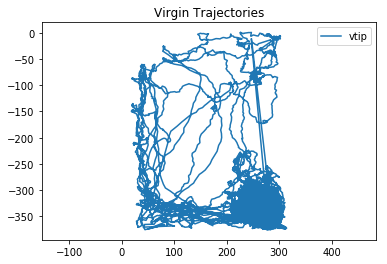

In [5]:
data[0].plot_trajectory([0])

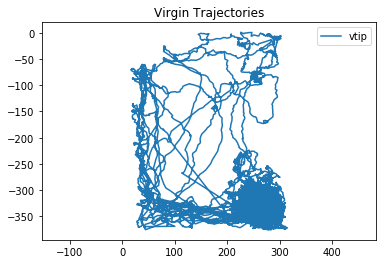

In [27]:
data[0].plot_trajectory([0])

In [45]:
i,windowlength,reference,ref_pindex,target,target_pindex = 100,10,val,np.arange(1000)[:,None],val,np.arange(1000)[:,None]

In [44]:
val = np.random.randn(1000,2)

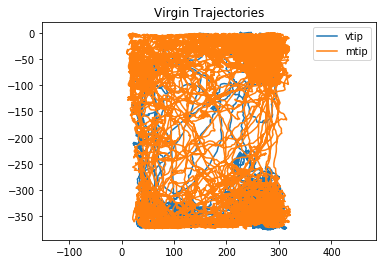

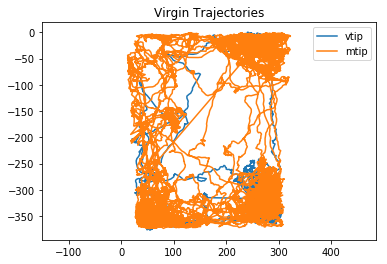

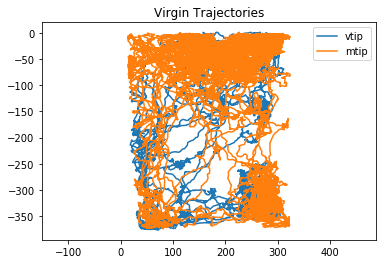

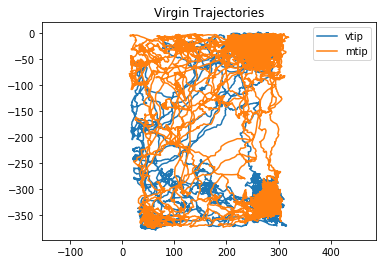

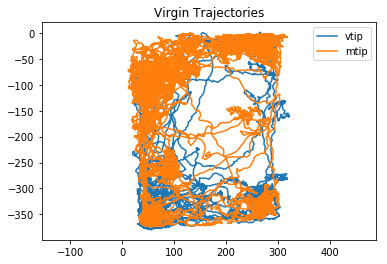

...

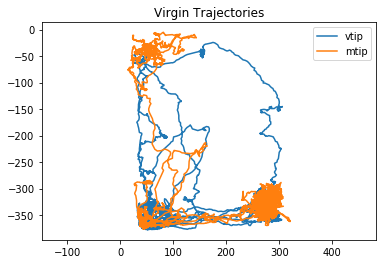

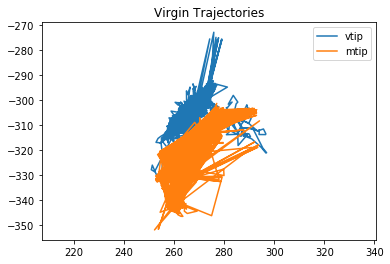

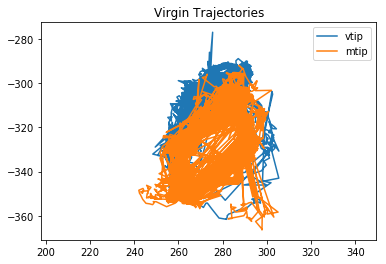

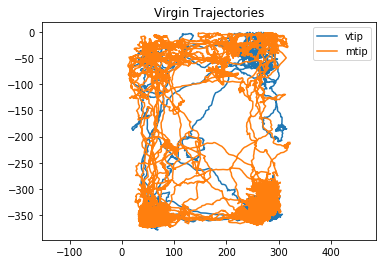

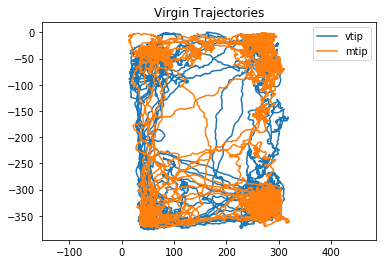

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [38]:
[data[i].plot_trajectory([0,5]) for i in range(30)] 

In [56]:
all_events

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 0.],
       [0., 0.],
       [0., 0.]])

In [136]:
example_later.bounds = (210,300)
all_events = find_duration([example_later])

IndexError: list index out of range

In [65]:
example_later.nest_ethogram(0)

array([False, False, False, ...,  True,  True,  True])

In [127]:
v_later = gaussian_filter1d(all_events[:,0],36000)
m_later = gaussian_filter1d(all_events[:,1],36000)

In [135]:
# plt.plot(all_events[:,0])
np.sum(v_later)

172.99999999999994

resetting filters...


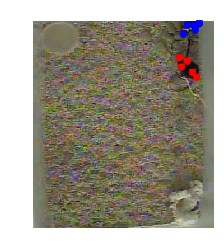

In [172]:
data[29].reset_filters([0,1,2,3,4,5,6,7,8,9])
data[29].import_movie(path+'29.mp4')
data[29].plot_image_compare([0,1,2,3,4,5,6,7,8,9],16000)

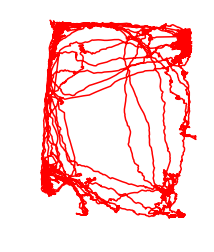

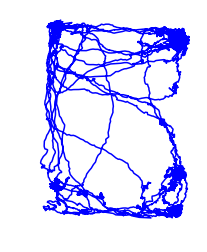

In [196]:
fig, ax = plt.subplots()
ax.set_aspect('equal')
ax.axis('off')
data[29].plot_trajectory([3],axes= ax,**{'color': 'red'})
plt.show()

fig, ax = plt.subplots()
data[29].plot_trajectory([8],axes = ax,**{'color': 'blue'})
ax.set_aspect('equal')
ax.axis('off')
plt.show()